Ghiffary Rifqialdi

From Data to Decision: Physics-Constrained Machine Learning for Seismic Risk Assessment in Italy



### Table of Contents
1. Setup & Data Loading
2. Data Understanding & EDA
3. Data Preparation
4. Modeling
5. Model Evaluation
6. Deployment

# Phase 1: Setup and Data Loading

In [40]:
import warnings
warnings.filterwarnings("ignore")

In [41]:
import numpy as np
import pandas as pd
# import janitor

pd.set_option('display.max_column', None)
pd.set_option('display.max_rows', None)
pd.set_option('display.max_seq_items', None)
pd.set_option('display.max_colwidth', 500)
pd.set_option('expand_frame_repr', True)

In [42]:
def info(df):
    def types(s):
        return s.dtypes
    def unique_nan(s):
        return s.nunique(dropna=False)
    def count_nulls(s):
        return s.size - s.count()
    def null_percentage(s):
        return round(((s.size - s.count()) * 100 / s.size), 2)
    output = df.agg([types, 'count', 'nunique', 'size', unique_nan, count_nulls, null_percentage, 'unique']).transpose()
    output.reset_index(inplace=True)
    output.columns = ['Column', 'Data Type', 'Row Count', 'Unique Count', 'Total Row', 'Unique Count + NAN', 'Missing Value Count', 'Missing Value Percentage', 'Unique']
    output['Description'] = [name.replace("_"," ").title() for name in output['Column']]
    output = output[['Column', 'Description', 'Data Type', 'Row Count', 'Unique Count', 'Total Row', 'Unique Count + NAN', 'Missing Value Count', 'Missing Value Percentage', 'Unique']]
    return output

def describe(df):
    output = df.describe().transpose()
    output.reset_index(inplace=True)
    output.columns = ['Column', 'Row Count', 'Average', 'Standard Deviation', 'Minimum Value', '25%', '50%', '75%', 'Maximum Value']
    return output

In [43]:
import os
import random
import numpy as np
import pandas as pd
from pathlib import Path
import json
import joblib
from datetime import datetime

from grplot import plot2d, analytic
import grplot as gp
import grplot_seaborn as gs
gs.set_theme(context='notebook', style='darkgrid', palette='deep')
import matplotlib
matplotlib.rcParams['axes.formatter.limits'] = [-5,18]
matplotlib.rcParams['figure.dpi'] = 300
import matplotlib.pyplot as plt

from scipy import stats
from scipy.stats import pearsonr, spearmanr
from statsmodels.stats.outliers_influence import variance_inflation_factor

from sklearn.model_selection import GroupKFold, cross_val_predict
from sklearn.preprocessing import RobustScaler, LabelEncoder
from sklearn.linear_model import LinearRegression, Ridge
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF, WhiteKernel, ConstantKernel as C
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

import xgboost as xgb
import lightgbm as lgb
import catboost as cb

import optuna
optuna.logging.set_verbosity(optuna.logging.WARNING)

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset

import shap

PROJECT_ROOT = Path('/home/ghiffaryr/Physics-Constrained-Machine-Learning-for-Seismic-Risk-Assessment-in-Italy')
DATA_PATH = PROJECT_ROOT / 'data' / 'ITA18_SA_flatfile.csv'
FIGURES_PATH = PROJECT_ROOT / 'figures'
MODELS_PATH = PROJECT_ROOT / 'models'
REPORTS_PATH = PROJECT_ROOT / 'reports'

FIGURES_PATH.mkdir(parents=True, exist_ok=True)
MODELS_PATH.mkdir(parents=True, exist_ok=True)
REPORTS_PATH.mkdir(parents=True, exist_ok=True)

(FIGURES_PATH / 'eda').mkdir(exist_ok=True)
(FIGURES_PATH / 'model_diagnostics').mkdir(exist_ok=True)
(FIGURES_PATH / 'deployment').mkdir(exist_ok=True)
(MODELS_PATH / 'pytorch_model').mkdir(exist_ok=True)

# Random seed for reproducibility
RANDOM_STATE = 42

def set_seed(seed=RANDOM_STATE):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False
    os.environ['PYTHONHASHSEED'] = str(seed)

set_seed(RANDOM_STATE)

print("numpy version:", np.__version__)
print("pandas version:", pd.__version__)
print("xgboost version:", xgb.__version__)
print("lightgbm version:", lgb.__version__)
print("catboost version:", cb.__version__)
print("optuna version:", optuna.__version__)
print("torch version:", torch.__version__)
print("shap version:", shap.__version__)
print("matplotlib version:", matplotlib.__version__)
print("grplot version:", gp.__version__)

numpy version: 1.26.4
pandas version: 1.5.3
xgboost version: 1.6.2
lightgbm version: 4.6.0
catboost version: 1.0.6
optuna version: 4.0.0
torch version: 2.1.2+cu121
shap version: 0.47.2
matplotlib version: 3.7.5
grplot version: 1.0.2


numpy version: 1.26.4
pandas version: 1.5.3
xgboost version: 1.6.2
lightgbm version: 4.6.0
catboost version: 1.0.6
optuna version: 4.0.0
torch version: 2.1.2+cu121
shap version: 0.47.2
matplotlib version: 3.7.5
grplot version: 1.0.2

In [44]:
df = pd.read_csv(DATA_PATH, sep=';', low_memory=False)
print(df.shape)
df = df.drop_duplicates(subset=['event_id', 'station_code'])
df = df.dropna(subset=['rotD50_pga', 'rotD50_pgv', 'rotD50_T1_000'])
print(df.shape)
df.head()

(5778, 256)
(5743, 256)


,event_id,event_time,ISC_ev_id,USGS_ev_id,INGV_ev_id,EMSC_ev_id,ev_nation_code,ev_latitude,ev_longitude,ev_depth_km,ev_hyp_ref,fm_type_code,ML,ML_ref,Mw,Mw_ref,Ms,Ms_ref,event_source_id,es_nucleation_latitude,es_nucleation_longitude,es_nucleation_coord_ref,es_nucleation_depth,es_nucleation_depth_ref,es_strike,es_dip,es_rake,es_strike_dip_rake_ref,es_z_top,es_z_top_ref,es_latul,es_lonul,es_latur,es_lonur,es_latlr,es_lonlr,es_latll,es_lonll,es_length,es_width,es_geometry_ref,network_code,station_code,location_code,instrument_code,sensor_depth_m,proximity_code,housing_code,installation_code,st_nation_code,st_latitude,st_longitude,st_elevation,ec8_code,ec8_code_method,ec8_code_ref,vs30_m_sec,vs30_ref,vs30_calc_method,vs30_meas_type,slope_deg,vs30_m_sec_WA,epi_dist,epi_az,nucl_epi_dist,JB_dist,rup_dist,Rx_dist,Ry0_dist,instrument_type_code,late_triggered_flag_01,web_availability_code,U_channel_code,U_azimuth_deg,V_channel_code,V_azimuth_deg,W_channel_code,W_azimuth_deg,U_hp,V_hp,W_hp,U_lp,V_lp,W_lp,U_pga,V_pga,W_pga,rotD50_pga,U_pgv,V_pgv,W_pgv,rotD50_pgv,U_pgd,V_pgd,W_pgd,rotD50_pgd,U_T90,V_T90,W_T90,rotD50_T90,U_housner,V_housner,W_housner,rotD50_housner,U_CAV,V_CAV,W_CAV,rotD50_CAV,U_ia,V_ia,W_ia,rotD50_ia,U_T0_010,U_T0_025,U_T0_040,U_T0_050,U_T0_070,U_T0_100,U_T0_150,U_T0_200,U_T0_250,U_T0_300,U_T0_350,U_T0_400,U_T0_450,U_T0_500,U_T0_600,U_T0_700,U_T0_750,U_T0_800,U_T0_900,U_T1_000,U_T1_200,U_T1_400,U_T1_600,U_T1_800,U_T2_000,U_T2_500,U_T3_000,U_T3_500,U_T4_000,U_T4_500,U_T5_000,U_T6_000,U_T7_000,U_T8_000,U_T9_000,U_T10_000,V_T0_010,V_T0_025,V_T0_040,V_T0_050,V_T0_070,V_T0_100,V_T0_150,V_T0_200,V_T0_250,V_T0_300,V_T0_350,V_T0_400,V_T0_450,V_T0_500,V_T0_600,V_T0_700,V_T0_750,V_T0_800,V_T0_900,V_T1_000,V_T1_200,V_T1_400,V_T1_600,V_T1_800,V_T2_000,V_T2_500,V_T3_000,V_T3_500,V_T4_000,V_T4_500,V_T5_000,V_T6_000,V_T7_000,V_T8_000,V_T9_000,V_T10_000,W_T0_010,W_T0_025,W_T0_040,W_T0_050,W_T0_070,W_T0_100,W_T0_150,W_T0_200,W_T0_250,W_T0_300,W_T0_350,W_T0_400,W_T0_450,W_T0_500,W_T0_600,W_T0_700,W_T0_750,W_T0_800,W_T0_900,W_T1_000,W_T1_200,W_T1_400,W_T1_600,W_T1_800,W_T2_000,W_T2_500,W_T3_000,W_T3_500,W_T4_000,W_T4_500,W_T5_000,W_T6_000,W_T7_000,W_T8_000,W_T9_000,W_T10_000,rotD50_T0_010,rotD50_T0_025,rotD50_T0_040,rotD50_T0_050,rotD50_T0_070,rotD50_T0_100,rotD50_T0_150,rotD50_T0_200,rotD50_T0_250,rotD50_T0_300,rotD50_T0_350,rotD50_T0_400,rotD50_T0_450,rotD50_T0_500,rotD50_T0_600,rotD50_T0_700,rotD50_T0_750,rotD50_T0_800,rotD50_T0_900,rotD50_T1_000,rotD50_T1_200,rotD50_T1_400,rotD50_T1_600,rotD50_T1_800,rotD50_T2_000,rotD50_T2_500,rotD50_T3_000,rotD50_T3_500,rotD50_T4_000,rotD50_T4_500,rotD50_T5_000,rotD50_T6_000,rotD50_T7_000,rotD50_T8_000,rotD50_T9_000,rotD50_T10_000
0,EMSC-20080613_0000091,2008-06-13 23:43:46,13377361.0,usp000g9h6,NaN,20080613_0000091,JP,39.0298,140.8807,5.0,Dawood_et_al_2016,TF,5.1,ISC-webservice,6.9,Dawood_et_al_2016,7.06,ISC-webservice,NGA279,39.027,140.878,NGA2_Database,6.5,NGA2_Database,209.0,40.0,104.0,NGA2_Database,0.7,NGA2_Database,39.1462,141.055,38.8308,140.831,38.8908,140.692,39.2064,140.915,40.0,18.0,NGA2_Database,BO,AKT18,0,HN,0.0,NaN,NaN,NaN,JP,39.8147,140.5790,318.0,B,VS30,Vs30_ref,475.0,NIED,0.0,DH,3.181600,504.525007,90.9,163.3,91.13,73.43,74.45,71.71,45.14,D,0.0,9,E,90.0,N,0.0,Z,0.0,0.05,0.05,0.05,40.0,40.0,40.0,-52.774377,39.582032,-26.063117,44.489649,2.346598,3.128132,-1.872178,2.920070,1.504164,-1.923240,-1.248052,1.736410,23.090,26.235,26.480,24.6625,8.66805,7.62048,5.00675,8.197180,255.225514,258.758658,164.024895,257.021093,3.758302,3.504239,1.426843,3.631270,52.9369,55.3553,59.4326,72.9874,118.624,105.741,142.840,120.1100,87.9982,96.5384,61.8244,70.3233,76.9653,68.0372,72.8462,44.4620,34.0050,39.4026,49.0553,26.7880,23.6101,18.7655,10.1292,8.6866,7.81785,4.98587,4.36124,4.5518,5.04750,4.78087,3.30914,3.64806,3.83080,2.80000,1.82099,1.28618,39.7958,40.9675,43.5312,53.9273,85.4485,70.9437,101.467,138.0520,86.1993,85.5564,89.0426,49.0943,65.0437,87.2839,68.3530,34.5601,27.9779,41.1795,27.1247,27.56

In [45]:
print('Check if any anomalies')
print(df[df['rotD50_pga'] <= 0].shape[0])
print(df[df['rotD50_pgv'] <= 0].shape[0])
print(df[df['rotD50_T1_000'] <= 0].shape[0])

Check if any anomalies
0
0
0


In [46]:
print(f"Dataset shape: {df.shape}")
print(f"Total records: {len(df):,}")
print(f"Total columns: {len(df.columns)}")

Dataset shape: (5743, 256)
Total records: 5,743
Total columns: 256


# Phase 2: Data Understanding and Exploratory Data Analysis

## 2.1 Dataset Structure Overview

In [47]:
df_info = info(df)
df_info.to_excel(DATA_PATH.parent / 'df_info.xlsx', index=False)

In [48]:
df_statistics = describe(df)
df_statistics.to_excel(DATA_PATH.parent / 'df_statistics.xlsx', index=False)

In [49]:
n_events = df['event_id'].nunique()
n_stations = df['station_code'].nunique()

df['event_time'] = pd.to_datetime(df['event_time'], errors='coerce')
date_range = (df['event_time'].min(), df['event_time'].max())

records_per_event = df.groupby('event_id').size()

mw_range = (df['Mw'].min(), df['Mw'].max())

print(f"\nOverview:")
print(f"  Total records: {len(df):,}")
print(f"  Unique earthquakes: {n_events}")
print(f"  Unique stations: {n_stations}")

print(f"\nTemporal Coverage:")
print(f"  From: {date_range[0]}")
print(f"  To:   {date_range[1]}")

print(f"\nMagnitude Range:")
print(f"  Mw: {mw_range[0]:.1f} - {mw_range[1]:.1f}")

print(f"\nRecords per Event:")
print(f"  Mean: {records_per_event.mean():.1f}")
print(f"  Median: {records_per_event.median():.0f}")
print(f"  Range: {records_per_event.min()} - {records_per_event.max()}")


Overview:
  Total records: 5,743
  Unique earthquakes: 155
  Unique stations: 1650

Temporal Coverage:
  From: 1976-05-06 20:00:12
  To:   2016-11-13 11:02:58

Magnitude Range:
  Mw: 3.5 - 8.0

Records per Event:
  Mean: 37.1
  Median: 21
  Range: 1 - 191


In [50]:
# Count unique events and stations
n_events = df['event_id'].nunique()
n_stations = df['station_code'].nunique()

# Temporal coverage
df['event_time'] = pd.to_datetime(df['event_time'], errors='coerce')
date_range = (df['event_time'].min(), df['event_time'].max())

# Records per event statistics
records_per_event = df.groupby('event_id').size()

# Magnitude range
mw_range = (df['Mw'].min(), df['Mw'].max())

print(f"Overview:")
print(f"  Total records: {len(df):,}")
print(f"  Unique earthquakes: {n_events}")
print(f"  Unique stations: {n_stations}")

print(f"\nTemporal Coverage:")
print(f"  From: {date_range[0]}")
print(f"  To:   {date_range[1]}")

print(f"\nMagnitude Range:")
print(f"  Mw: {mw_range[0]:.1f} - {mw_range[1]:.1f}")

print(f"\nRecords per Event:")
print(f"  Mean: {records_per_event.mean():.1f}")
print(f"  Median: {records_per_event.median():.0f}")
print(f"  Range: {records_per_event.min()} - {records_per_event.max()}")

Overview:
  Total records: 5,743
  Unique earthquakes: 155
  Unique stations: 1650

Temporal Coverage:
  From: 1976-05-06 20:00:12
  To:   2016-11-13 11:02:58

Magnitude Range:
  Mw: 3.5 - 8.0

Records per Event:
  Mean: 37.1
  Median: 21
  Range: 1 - 191


## 2.2 Train/Test Split

In [51]:
HOLDOUT_TEST_SIZE = 0.10

def temporal_train_test_split(df, test_size=0.10):
    df = df.copy()
    df['event_time'] = pd.to_datetime(df['event_time'], errors='coerce')
    
    event_info = df.groupby('event_id').agg({
        'event_time': 'first',
        'Mw': 'count'
    }).reset_index()
    event_info.columns = ['event_id', 'event_time', 'n_records']
    event_info = event_info.sort_values('event_time')
    
    total_records = len(df)
    target_test_records = int(total_records * test_size)
    
    # Add events from latest until we reach target test size
    test_event_ids = []
    test_records = 0
    
    for _, row in event_info.iloc[::-1].iterrows():
        if test_records < target_test_records:
            test_event_ids.append(row['event_id'])
            test_records += row['n_records']
        else:
            break
    
    test_event_ids = set(test_event_ids)
    
    test_mask = df['event_id'].isin(test_event_ids)
    train_mask = ~test_mask
    
    df_train = df[train_mask].copy()
    df_test = df[test_mask].copy()
    
    train_date_range = (df_train['event_time'].min(), df_train['event_time'].max())
    test_date_range = (df_test['event_time'].min(), df_test['event_time'].max())
    
    n_train_events = df_train['event_id'].nunique()
    n_test_events = df_test['event_id'].nunique()
    
    print(f"Train Set: {len(df_train):,} records from {n_train_events} events")
    print(f"  Date range: {train_date_range[0]} to {train_date_range[1]}")
    print(f"\nTest Set: {len(df_test):,} records from {n_test_events} events")
    print(f"  Date range: {test_date_range[0]} to {test_date_range[1]}")
    print(f"\nTest percentage: {len(df_test) / len(df) * 100:.1f}%")
    
    return df_train, df_test, {
        'n_train_records': len(df_train),
        'n_test_records': len(df_test),
        'n_train_events': n_train_events,
        'n_test_events': n_test_events,
        'train_date_range': train_date_range,
        'test_date_range': test_date_range,
        'test_event_ids': list(test_event_ids)
    }

df_train, df_test, split_info = temporal_train_test_split(df, test_size=HOLDOUT_TEST_SIZE)

Train Set: 5,039 records from 150 events
  Date range: 1976-05-06 20:00:12 to 2016-10-26 19:18:06

Test Set: 704 records from 5 events
  Date range: 2016-10-30 06:40:18 to 2016-11-13 11:02:58

Test percentage: 12.3%


In [52]:
df_train_info = info(df_train)
df_train_info.to_excel(DATA_PATH.parent / 'df_train_info.xlsx', index=False)

df_test_info = info(df_test)
df_test_info.to_excel(DATA_PATH.parent / 'df_test_info.xlsx', index=False)

In [53]:
df_train_statistics = describe(df_train)
df_train_statistics.to_excel(DATA_PATH.parent / 'df_train_statistics.xlsx', index=False)

df_test_statistics = describe(df_test)
df_test_statistics.to_excel(DATA_PATH.parent / 'df_test_statistics.xlsx', index=False)

## 2.3 Earthquake Source Variables Analysis

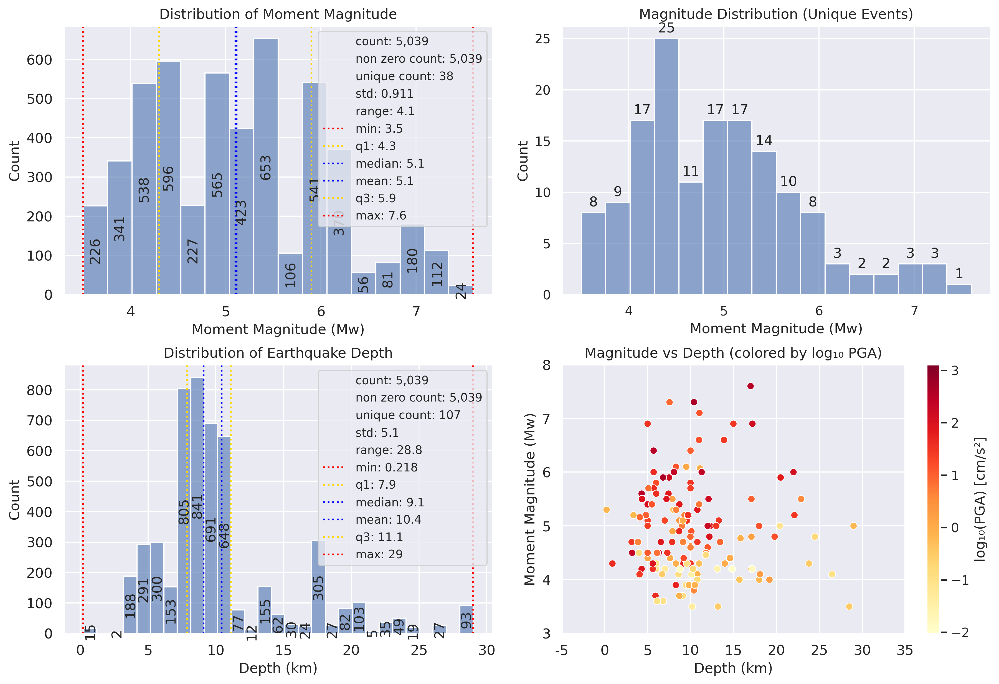

In [54]:
ax = plot2d(plot={'[1,1]':'histplot', '[1,2]':None, '[2,1]':'histplot', '[2,2]':'scatterplot'},
            Nx=2,
            Ny=2,
            df=df_train,
            x=['Mw', None, 'ev_depth_km', 'ev_depth_km'],
            y=[None, None, None, 'Mw'],
            xlabel={'[1,1]':'Moment Magnitude (Mw)', '[2,1]':'Depth (km)', '[2,2]':'Depth (km)'},
            ylabel={'[2,2]':'Moment Magnitude (Mw)'},
            hpad=3,
            wpad=2,
            figsize=[12,8],
            fontsize=12,
            legend_fontsize=10,
            sep=',',
            statdesc={'[1,1]':{'Mw':'general'}, '[2,1]':{'ev_depth_km':'general'}},
            stat='count',
            binwidth={'[1,1]':0.25, '[2,1]':1},
            palette={'[2,2]':'YlOrRd'},
            hue={'[2,2]':'rotD50_pga'},
            hue_norm={'[2,2]':plt.matplotlib.colors.LogNorm()},
            text={'Count':'v+i'},
            title={'[1,1]':'Distribution of Moment Magnitude', '[2,1]':'Distribution of Earthquake Depth',  '[2,2]':'Magnitude vs Depth (colored by log₁₀ PGA)'},
            alpha={'[1,1]':0.6, '[1,2]':0.6, '[2,1]':0.6},
            )

# Use unique events dataset for magnitude distribution
events_df = df_train.drop_duplicates('event_id')
ax[0,1].set_title('Magnitude Distribution (Unique Events)')
hist = gs.histplot(events_df['Mw'], binwidth=0.25, ax=ax[0,1], alpha=0.6)
hist.set_xlabel('Moment Magnitude (Mw)')

for p in ax[0,1].patches:
    left, bottom, width, height = p.get_bbox().bounds
    list_height = np.array([p.get_height() for p in ax[0,1].patches])
    max_height = list_height.max()
    text_fontsize = 12
    ax[0,1].annotate((f'{height:.0f}'), xy=(left+width/2, height+max_height*0.0325*text_fontsize/10), ha='center', va='center', fontsize=text_fontsize)

# Add colorbar for the scatter plot
mappable = ax[1,1].collections[0]
mappable.set_cmap('YlOrRd')
mappable.set_array(np.log10(df_train['rotD50_pga'].dropna().values))
cbar = plt.colorbar(mappable, ax=ax[1,1])
cbar.set_label('log₁₀(PGA) [cm/s²]')
ax[1,1].legend().remove()

plt.savefig(FIGURES_PATH / 'eda' / 'mw_depth_distributions.png', bbox_inches='tight')

Fault Mechanism Distribution:
   NF (Normal Fault): 2265 records (44.9%)
   TF (Thrust/Reverse): 1680 records (33.3%)
   SS (Strike-Slip): 1088 records (21.6%)
   U (Unknown/Undetermined): 6 records (0.1%)


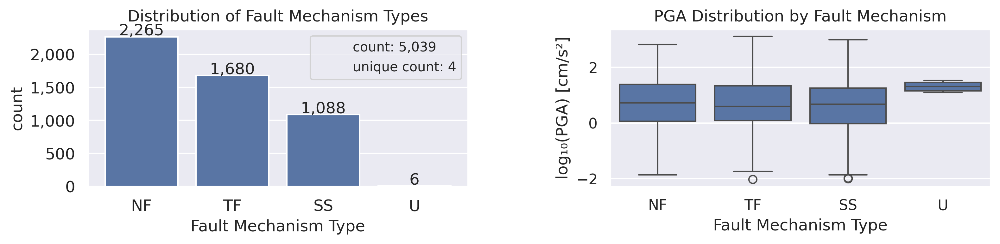

In [55]:
ax = plot2d(plot={'[1]':'countplot', '[2]':None},
            Nx=2,
            Ny=1,
            df=df_train,
            x=['fm_type_code', None],
            y=[None, None],
            xlabel='Fault Mechanism Type',
            ylabel={'[2]':'PGA (cm/s²)'},
            figsize=[12,4],
            fontsize=12,
            legend_fontsize=10,
            text={'[1]':'h'},
            ylog={'[2]':'log'},
            ylabel_add={'[2]':'_ cm/s²'},
            xstatdesc={'[1]':'count+unique'},
            order = df_train['fm_type_code'].value_counts().index,
            title={'[1]':'Distribution of Fault Mechanism Types', '[2]':'PGA Distribution by Fault Mechanism'},
            saveas=str(FIGURES_PATH / 'eda' / 'fault_mechanism_analysis.png'),
            )
# PGA by mechanism (box plot)
ax2 = ax[1]
temp = df_train[df_train['rotD50_pga'] > 0].copy()
temp['log_pga'] = np.log10(temp['rotD50_pga'])
box = gs.boxplot(x=temp['fm_type_code'], y=temp['log_pga'].dropna(), order=df_train['fm_type_code'].value_counts().index,
                  ax=ax2)
ax2.set_xlabel('Fault Mechanism Type')
ax2.set_ylabel('log₁₀(PGA) [cm/s²]')
ax2.set_title('PGA Distribution by Fault Mechanism')

plt.savefig(FIGURES_PATH / 'eda' / 'fault_mechanism_analysis.png', bbox_inches='tight')

print("Fault Mechanism Distribution:")
fm_counts = df_train['fm_type_code'].value_counts()

mechanism_names = {
    'NF': 'Normal Fault',
    'SS': 'Strike-Slip',
    'TF': 'Thrust/Reverse',
    'U': 'Unknown/Undetermined'
}
for mech, count in fm_counts.items():
    pct = count / len(df_train) * 100
    name = mechanism_names.get(mech, 'Other')
    print(f"   {mech} ({name}): {count} records ({pct:.1f}%)")

In [56]:
df_train.groupby('fm_type_code')['rotD50_pga'].mean()

fm_type_code
NF    26.963196
SS    27.997475
TF    30.593274
U     21.967484
Name: rotD50_pga, dtype: float64

Encoding candidate
NF: 0
SS: 1
TF: 2
U: 0

## 2.4 Distance Metrics Analysis

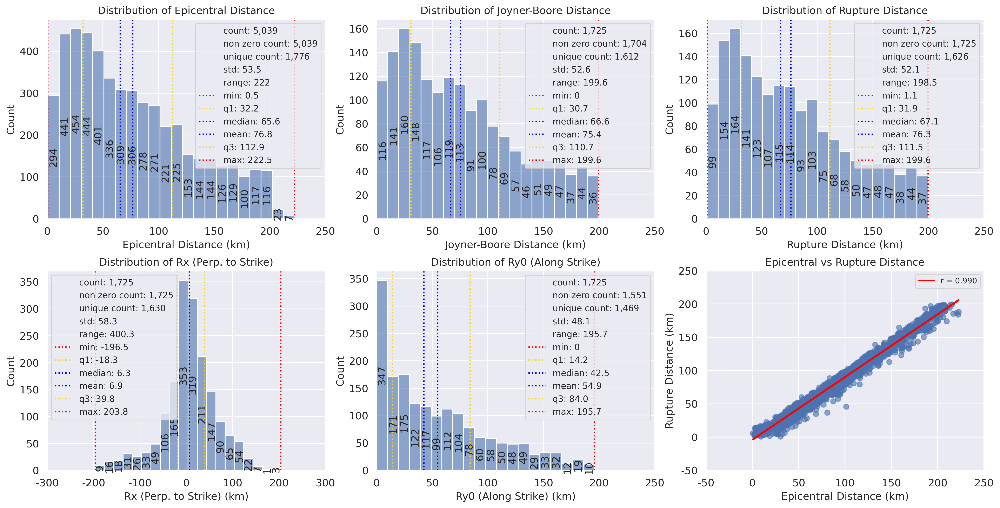

In [57]:
from matplotlib.lines import Line2D

ax = plot2d(plot={'[1,1]':'histplot', '[1,2]':'histplot', '[1,3]':'histplot', '[2,1]':'histplot', '[2,2]':'histplot', '[2,3]':'regplot'},
            Nx=3,
            Ny=2,
            df=df_train,
            x=['epi_dist', 'JB_dist', 'rup_dist', 'Rx_dist', 'Ry0_dist', 'epi_dist'],
            y=[None, None, None, None, None, 'rup_dist'],
            xlabel={'[1,1]':'Epicentral Distance (km)', '[1,2]':'Joyner-Boore Distance (km)', '[1,3]':'Rupture Distance (km)', '[2,1]':'Rx (Perp. to Strike) (km)', '[2,2]':'Ry0 (Along Strike) (km)', '[2,3]':'Epicentral Distance (km)'},
            ylabel={'[2,3]':'Rupture Distance (km)'},
            hpad=3,
            wpad=2,
            figsize=[16,8],
            fontsize=12,
            legend_fontsize=10,
            sep=',',
            xlim={'[1,1]':[0, 250], '[1,2]':[0, 250], '[1,3]':[0, 250], '[2,1]':[-250, 250], '[2,2]':[0, 250]},
            statdesc={'[1,1]':{'epi_dist':'general'}, '[1,2]':{'JB_dist':'general'}, '[1,3]':{'rup_dist':'general'}, '[2,1]':{'Rx_dist':'general'}, '[2,2]':{'Ry0_dist':'general'}},
            stat='count',
            binwidth={'[1,1]':10, '[1,2]':10, '[1,3]':10, '[2,1]':20, '[2,2]':10},
            line_kws={'color':'red'},
            scatter_kws={'alpha':0.6},
            text={'Count':'v+i'},
            title={'[1,1]':'Distribution of Epicentral Distance', '[1,2]':'Distribution of Joyner-Boore Distance', '[1,3]':'Distribution of Rupture Distance', '[2,1]':'Distribution of Rx (Perp. to Strike)', '[2,2]':'Distribution of Ry0 (Along Strike)', '[2,3]':'Epicentral vs Rupture Distance'},
            alpha={'[1,1]':0.6, '[1,2]':0.6, '[1,3]':0.6, '[2,1]':0.6, '[2,2]':0.6},
            )
temp = df_train[['epi_dist', 'rup_dist']].dropna()
corr = np.corrcoef(temp['epi_dist'], temp['rup_dist'])[0, 1]
ax[1,2].legend(
    [Line2D([0], [0], color='red')],
    [f'r = {corr:.3f}'],
    fontsize=9,
    loc='best'
)
plt.savefig(FIGURES_PATH / 'eda' / 'distance_distributions.png', bbox_inches='tight')

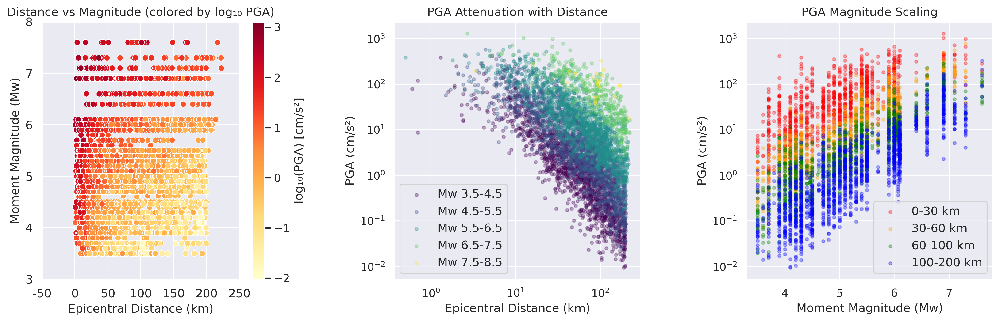

In [58]:
ax = plot2d(plot={'[1]':'scatterplot', '[2]':None, '[3]':None},
            Nx=3,
            Ny=1,
            df=df_train,
            x=['epi_dist', None, None],
            y=['Mw', None, None],
            xlabel={'[1]':'Epicentral Distance (km)'},
            ylabel={'[1]':'Moment Magnitude (Mw)'},
            figsize=[16,6],
            fontsize=12,
            legend_fontsize=10,
            palette={'[1]':'YlOrRd'},
            hue={'[1]':'rotD50_pga'},
            hue_norm={'[1]':plt.matplotlib.colors.LogNorm()},
            title={'[1]':'Distance vs Magnitude (colored by log₁₀ PGA)'},
            )

temp = df_train[['epi_dist', 'Mw', 'rotD50_pga']].dropna()

# Add colorbar for the scatter plot
mappable = ax[0].collections[0]
mappable.set_cmap('YlOrRd')
mappable.set_array(np.log10(temp['rotD50_pga'].values))
cbar = plt.colorbar(mappable, ax=ax[0])
cbar.set_label('log₁₀(PGA) [cm/s²]')
ax[0].legend().remove()

# PGA vs Distance (attenuation trend)
ax2 = ax[1]
colors_mw = plt.cm.viridis(np.linspace(0, 1, 5))
mw_bins = [(3.5, 4.5), (4.5, 5.5), (5.5, 6.5), (6.5, 7.5), (7.5, 8.5)]
for (mw_min, mw_max), color in zip(mw_bins, colors_mw):
    mask = (temp['Mw'] >= mw_min) & (temp['Mw'] < mw_max)
    subset = temp[mask]
    if len(subset) > 0:
        ax2.scatter(subset['epi_dist'], subset['rotD50_pga'], 
                   c=[color], alpha=0.3, s=10, label=f'Mw {mw_min}-{mw_max}')

ax2.set_xlabel('Epicentral Distance (km)')
ax2.set_ylabel('PGA (cm/s²)')
ax2.set_yscale('log')
ax2.set_xscale('log')
ax2.set_title('PGA Attenuation with Distance')
ax2.legend(fontsize=12)


# PGA vs Mw (scaling relation)
ax3 = ax[2]
dist_bins = [(0, 30), (30, 60), (60, 100), (100, 200)]
colors_dist = ['red', 'orange', 'green', 'blue']
for (d_min, d_max), color in zip(dist_bins, colors_dist):
    mask = (temp['epi_dist'] >= d_min) & (temp['epi_dist'] < d_max)
    subset = temp[mask]
    if len(subset) > 0:
        ax3.scatter(subset['Mw'], subset['rotD50_pga'], 
                   c=color, alpha=0.3, s=10, label=f'{d_min}-{d_max} km')

ax3.set_xlabel('Moment Magnitude (Mw)')
ax3.set_ylabel('PGA (cm/s²)')
ax3.set_yscale('log')
ax3.set_title('PGA Magnitude Scaling')
ax3.legend(fontsize=12)

plt.savefig(FIGURES_PATH / 'eda' / 'pga_attenuation_scaling.png', bbox_inches='tight')

## 2.5 Site Conditions Analysis


Vs30 Statistics:
   Available: 1459/5039 (29.0%)
   Range: 90 - 2925 m/s
   Median: 453 m/s

EC8 Site Class Distribution:
   B: 2163 (42.9%)
   C: 1493 (29.6%)
   A: 860 (17.1%)
   E: 133 (2.6%)
   D: 76 (1.5%)


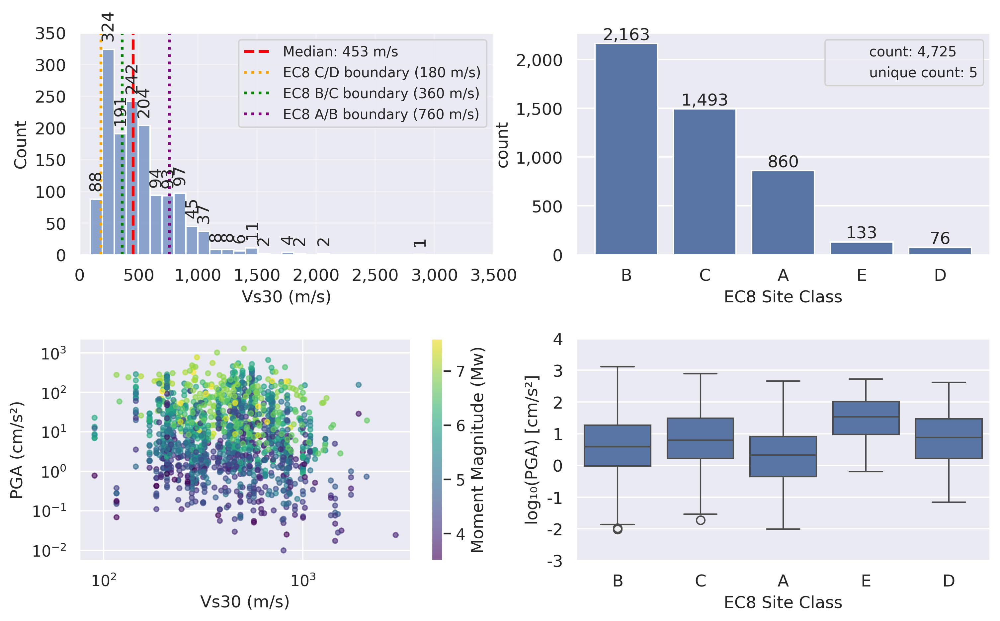

In [59]:
df_plot = df_train.copy()
df_plot['ec8_code'] = df_plot['ec8_code'].astype(str).str.replace('*', '', regex=False).replace('nan', np.nan)
df_plot['log_pga'] = np.log10(df_plot['rotD50_pga'].where(df_plot['rotD50_pga'] > 0))

ax = plot2d(plot={'[1,1]':'histplot', '[1,2]':'countplot', '[2,1]':None, '[2,2]':'boxplot'},
            Nx=2,
            Ny=2,
            df=df_plot,
            x=['vs30_m_sec', 'ec8_code', None, 'ec8_code'],
            y=[None, None, None, 'log_pga'],
            xlabel={'[1,1]':'Vs30 (m/s)', '[1,2]':'EC8 Site Class', '[2,2]':'EC8 Site Class'},
            ylabel={'[2,2]':'log₁₀(PGA) [cm/s²]'},
            hpad=3,
            wpad=2,
            figsize=[10, 6],
            fontsize=12,
            legend_fontsize=10,
            stat='count',
            binwidth={'[1,1]': 100},
            xlim={'[1,1]':[0, 3500]},
            xstatdesc={'[1,2]':'count+unique'},
            text={'Count':'v', 'count':'h'},
            alpha={'[1,1]':0.6},
            order=df_plot['ec8_code'].value_counts().index
)

# Vs30 Distribution
ax1 = ax[0, 0]
vs30_data = df_plot['vs30_m_sec'].dropna()
ax1.axvline(vs30_data.median(), color='red', linestyle='--', linewidth=2, 
            label=f'Median: {vs30_data.median():.0f} m/s')
ax1.axvline(180, color='orange', linestyle=':', linewidth=2, label='EC8 C/D boundary (180 m/s)')
ax1.axvline(360, color='green', linestyle=':', linewidth=2, label='EC8 B/C boundary (360 m/s)')
ax1.axvline(760, color='purple', linestyle=':', linewidth=2, label='EC8 A/B boundary (760 m/s)')
ax1.legend(fontsize=10)
ax1.grid(True, alpha=0.3)

# Matplotlib scatterplot for [2,1]
ax_scatter = ax[1, 0]
scatter_df = df_plot[['vs30_m_sec', 'rotD50_pga', 'Mw']].dropna()
scatter_df = scatter_df[scatter_df['rotD50_pga'] > 0]
scatter = ax_scatter.scatter(
    scatter_df['vs30_m_sec'],
    scatter_df['rotD50_pga'],
    c=scatter_df['Mw'],
    cmap='viridis',
    alpha=0.6,
    s=12
)
ax_scatter.set_xlabel('Vs30 (m/s)')
ax_scatter.set_ylabel('PGA (cm/s²)')
ax_scatter.set_xscale('log')
ax_scatter.set_yscale('log')

# Add colorbar for the scatter plot
cbar = plt.colorbar(scatter, ax=ax_scatter)
cbar.set_label('Moment Magnitude (Mw)')

plt.savefig(FIGURES_PATH / 'eda' / 'site_conditions_analysis.png', bbox_inches='tight')

ec8_counts = df_plot['ec8_code'].value_counts()

print(f"\nVs30 Statistics:")
print(f"   Available: {len(vs30_data)}/{len(df_plot)} ({len(vs30_data)/len(df_plot)*100:.1f}%)")
print(f"   Range: {vs30_data.min():.0f} - {vs30_data.max():.0f} m/s")
print(f"   Median: {vs30_data.median():.0f} m/s")
print(f"\nEC8 Site Class Distribution:")
for cls, count in ec8_counts.items():
    print(f"   {cls}: {count} ({count/len(df_plot)*100:.1f}%)")


In [60]:
df_plot.groupby('ec8_code')['rotD50_pga'].mean()

ec8_code
A    13.533770
B    24.194193
C    35.089244
D    40.125629
E    75.252626
Name: rotD50_pga, dtype: float64

Encoding candidate
A: 0
B: 1
C: 2
D: 3
E: 4

## 2.6 Ground Motion Outputs Analysis


Ground Motion Statistics:
   rotD50_pga:
      Range: 0.0095 - 1287.73
      Median: 4.69
      Mean (log): 0.662
   rotD50_pgv:
      Range: 0.0007 - 120.34
      Median: 0.32
      Mean (log): -0.516
   rotD50_T1_000:
      Range: 0.0070 - 1009.87
      Median: 2.92
      Mean (log): 0.443


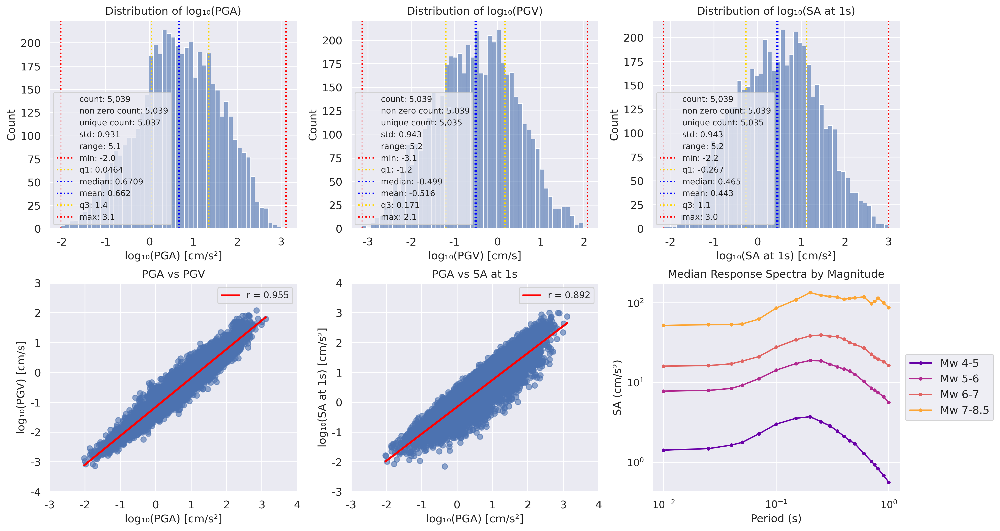

In [61]:
df_plot = df_train.copy()
df_plot['log_rotD50_pga'] = np.log10(df_plot['rotD50_pga'])
df_plot['log_rotD50_pgv'] = np.log10(df_plot['rotD50_pgv'])
df_plot['log_rotD50_T1_000'] = np.log10(df_plot['rotD50_T1_000'])

ax = plot2d(plot={'[1,1]':'histplot', '[1,2]':'histplot', '[1,3]':'histplot', '[2,1]':'regplot', '[2,2]':'regplot'},
            Nx=3,
            Ny=2,
            df=df_plot,
            x=['log_rotD50_pga', 'log_rotD50_pgv', 'log_rotD50_T1_000', 'log_rotD50_pga', 'log_rotD50_pga'],
            y=[None, None, None, 'log_rotD50_pgv', 'log_rotD50_T1_000'],
            xlabel={'[1,1]':'log₁₀(PGA) [cm/s²]', '[1,2]':'log₁₀(PGV) [cm/s]', '[1,3]':'log₁₀(SA at 1s) [cm/s²]', '[2,1]':'log₁₀(PGA) [cm/s²]', '[2,2]':'log₁₀(PGA) [cm/s²]'},
            ylabel={'[2,1]':'log₁₀(PGV) [cm/s]', '[2,2]':'log₁₀(SA at 1s) [cm/s²]'},
            hpad=3,
            wpad=2,
            figsize=[14,8],
            fontsize=12,
            legend_fontsize=9,
            stat='count',
            xstatdesc={'[1,1]':'general', '[1,2]':'general', '[1,3]':'general'},
            line_kws={'color':'red'},
            scatter_kws={'alpha':0.6},
            binwidth={'[1,1]':0.1, '[1,2]':0.1, '[1,3]':0.1},
            alpha={'[1,1]':0.6, '[1,2]':0.6, '[1,3]':0.6},
            legend_loc={'[1,1]':'lower left', '[1,2]':'lower left', '[1,3]':'lower left'},
            title={'[1,1]':'Distribution of log₁₀(PGA)', '[1,2]':'Distribution of log₁₀(PGV)', '[1,3]':'Distribution of log₁₀(SA at 1s)', '[2,1]':'PGA vs PGV', '[2,2]':'PGA vs SA at 1s'}, 
)

temp = df_plot[['log_rotD50_pga', 'log_rotD50_pgv']].dropna()
corr = np.corrcoef(temp['log_rotD50_pga'], temp['log_rotD50_pgv'])[0, 1]
ax[1,0].legend(
    [Line2D([0], [0], color='red')],
    [f'r = {corr:.3f}'],
    fontsize=10,
    loc='best'
)

temp = df_plot[['log_rotD50_pga', 'log_rotD50_T1_000']].dropna()
corr = np.corrcoef(temp['log_rotD50_pga'], temp['log_rotD50_T1_000'])[0, 1]
ax[1,1].legend(
    [Line2D([0], [0], color='red')],
    [f'r = {corr:.3f}'],
    fontsize=10,
    loc='best'
)

# Response spectra by magnitude bins
ax2 = ax[1,2]
spectral_cols = [c for c in df_train.columns if c.startswith('rotD50_T') and '_T' in c]
periods = []
for col in spectral_cols:
    try:
        parts = col.replace('rotD50_T', '').split('_')
        period = float(parts[0]) + float(parts[1]) / 1000
        periods.append((period, col))
    except:
        continue
periods.sort(key=lambda x: x[0])

# Plot mean spectra by Mw bin
mw_bins = [(4, 5), (5, 6), (6, 7), (7, 8.5)]
colors = plt.cm.plasma(np.linspace(0.2, 0.8, len(mw_bins)))
for (mw_min, mw_max), color in zip(mw_bins, colors):
    mask = (df_train['Mw'] >= mw_min) & (df_train['Mw'] < mw_max)
    subset = df_train[mask]
    mean_spectrum = []
    period_vals = []
    for p, col in periods[:20]:
        vals = subset[col].dropna()
        if len(vals) > 0:
            mean_spectrum.append(np.median(vals))
            period_vals.append(p)
    if len(mean_spectrum) > 0:
        ax2.plot(period_vals, mean_spectrum, 'o-', color=color, markersize=3,
                label=f'Mw {mw_min}-{mw_max}')

ax2.set_xlabel('Period (s)')
ax2.set_ylabel('SA (cm/s²)')
ax2.set_title('Median Response Spectra by Magnitude')
ax2.set_xscale('log')
ax2.set_yscale('log')
ax2.legend(fontsize=12, loc='center left', bbox_to_anchor=(1, 0.5))

plt.savefig(FIGURES_PATH / 'eda' / 'ground_motion_distributions.png', bbox_inches='tight')

print("\nGround Motion Statistics:")
targets = ['rotD50_pga', 'rotD50_pgv', 'rotD50_T1_000']
target_labels = ['PGA (cm/s²)', 'PGV (cm/s)', 'SA(1s) (cm/s²)']
for target, label in zip(targets, target_labels):
    data = df_train[target].dropna()
    data = data[data > 0]
    print(f"   {target}:")
    print(f"      Range: {data.min():.4f} - {data.max():.2f}")
    print(f"      Median: {data.median():.2f}")
    print(f"      Mean (log): {np.mean(np.log10(data)):.3f}")

# Phase 3: Data Preparation

## 3.1 Initial Features

In [62]:
source = ['Mw', 'ev_depth_km', 'fm_type_code', 'es_strike', 'es_dip', 'es_rake']
distance = ['epi_dist', 'JB_dist', 'rup_dist', 'Rx_dist', 'Ry0_dist']
site = ['vs30_m_sec', 'ec8_code']
FEATURE_COLS = source + distance + site
TARGET_COL = 'rotD50_pga'

In [63]:
df_train_initial_features = df_train[['event_id'] + FEATURE_COLS + [TARGET_COL]].copy()
df_train_initial_features.head()

,event_id,Mw,ev_depth_km,fm_type_code,es_strike,es_dip,es_rake,epi_dist,JB_dist,rup_dist,Rx_dist,Ry0_dist,vs30_m_sec,ec8_code,rotD50_pga
0,EMSC-20080613_0000091,6.9,5.0,TF,209.0,40.0,104.0,90.9,73.43,74.45,71.71,45.14,475.0,B,44.489649
1,EMSC-20080613_0000091,6.9,5.0,TF,209.0,40.0,104.0,75.2,58.68,59.96,64.15,30.14,620.0,E,70.433300
2,EMSC-20080613_0000091,6.9,5.0,TF,209.0,40.0,104.0,68.5,60.43,61.66,74.22,0.00,320.0,C,74.912529
3,EMSC-20080613_0000091,6.9,5.0,TF,209.0,40.0,104.0,48.9,38.02,39.94,51.80,0.00,829.0,A,77.633071
4,EMSC-20080613_0000091,6.9,5.0,TF,209.0,40.0,104.0,33.8,19.72,23.22,33.50,0.00,455.0,E,178.485001


## 3.2 Target Transformation

In [64]:
df_target_log = df_train_initial_features.copy()
df_target_log['log_pga'] = np.log10(df_target_log[TARGET_COL])
df_target_log = df_target_log.drop(columns=[TARGET_COL])
df_target_log.head()

,event_id,Mw,ev_depth_km,fm_type_code,es_strike,es_dip,es_rake,epi_dist,JB_dist,rup_dist,Rx_dist,Ry0_dist,vs30_m_sec,ec8_code,log_pga
0,EMSC-20080613_0000091,6.9,5.0,TF,209.0,40.0,104.0,90.9,73.43,74.45,71.71,45.14,475.0,B,1.648259
1,EMSC-20080613_0000091,6.9,5.0,TF,209.0,40.0,104.0,75.2,58.68,59.96,64.15,30.14,620.0,E,1.847778
2,EMSC-20080613_0000091,6.9,5.0,TF,209.0,40.0,104.0,68.5,60.43,61.66,74.22,0.00,320.0,C,1.874554
3,EMSC-20080613_0000091,6.9,5.0,TF,209.0,40.0,104.0,48.9,38.02,39.94,51.80,0.00,829.0,A,1.890047
4,EMSC-20080613_0000091,6.9,5.0,TF,209.0,40.0,104.0,33.8,19.72,23.22,33.50,0.00,455.0,E,2.251602


In [65]:
TARGET_COL = 'log_pga'

## 3.2 Categorical Encoding

In [66]:
fm_mapping = {'NF': 0, 'SS': 1, 'TF': 2, 'U': 0}
ec8_mapping = {'A': 0, 'B': 1, 'C': 2, 'D': 3, 'E': 4, 'A*': 0, 'B*': 1, 'C*': 2, 'D*': 3, 'E*': 4}
df_train_encoded = df_target_log.copy()
df_train_encoded['fm_encoded'] = df_train_encoded['fm_type_code'].map(fm_mapping)
df_train_encoded['ec8_encoded'] = df_train_encoded['ec8_code'].map(ec8_mapping)
df_train_encoded = df_train_encoded.drop(columns=['fm_type_code', 'ec8_code'])
df_train_encoded.head()

,event_id,Mw,ev_depth_km,es_strike,es_dip,es_rake,epi_dist,JB_dist,rup_dist,Rx_dist,Ry0_dist,vs30_m_sec,log_pga,fm_encoded,ec8_encoded
0,EMSC-20080613_0000091,6.9,5.0,209.0,40.0,104.0,90.9,73.43,74.45,71.71,45.14,475.0,1.648259,2,1.0
1,EMSC-20080613_0000091,6.9,5.0,209.0,40.0,104.0,75.2,58.68,59.96,64.15,30.14,620.0,1.847778,2,4.0
2,EMSC-20080613_0000091,6.9,5.0,209.0,40.0,104.0,68.5,60.43,61.66,74.22,0.00,320.0,1.874554,2,2.0
3,EMSC-20080613_0000091,6.9,5.0,209.0,40.0,104.0,48.9,38.02,39.94,51.80,0.00,829.0,1.890047,2,0.0
4,EMSC-20080613_0000091,6.9,5.0,209.0,40.0,104.0,33.8,19.72,23.22,33.50,0.00,455.0,2.251602,2,4.0


In [67]:
source = ['Mw', 'ev_depth_km', 'fm_encoded', 'es_strike', 'es_dip', 'es_rake']
distance = ['epi_dist', 'JB_dist', 'rup_dist', 'Rx_dist', 'Ry0_dist']
site = ['vs30_m_sec', 'ec8_encoded']
FEATURE_COLS = source + distance + site

## 3.3 Missing Data Analysis

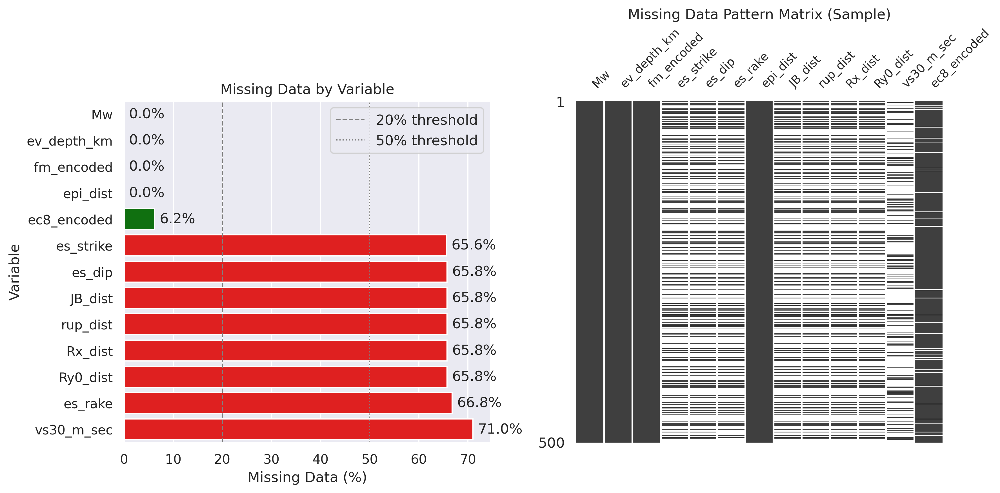


Missing Data Summary:
   Variable  Missing  Available  Missing %
         Mw        0       5039   0.000000
ev_depth_km        0       5039   0.000000
 fm_encoded        0       5039   0.000000
   epi_dist        0       5039   0.000000
ec8_encoded      314       4725   6.231395
  es_strike     3307       1732  65.628101
     es_dip     3314       1725  65.767017
    JB_dist     3314       1725  65.767017
   rup_dist     3314       1725  65.767017
    Rx_dist     3314       1725  65.767017
   Ry0_dist     3314       1725  65.767017
    es_rake     3365       1674  66.779123
 vs30_m_sec     3580       1459  71.045842


In [68]:
def check_missing_data(df, features):
    missing_info = []
    for feature in features:
        total = len(df)
        missing = df[feature].isna().sum()
        available = total - missing
        missing_pct = (missing / total) * 100
        missing_info.append({
            'Variable': feature,
            'Missing': missing,
            'Available': available,
            'Missing %': missing_pct
        })
    return pd.DataFrame(missing_info)
    
missing_df = check_missing_data(df_train_encoded, FEATURE_COLS).sort_values('Missing %', ascending=True)

fig, axes = plt.subplots(1, 2, figsize=(12, 6))

ax1 = axes[0]
colors = ['red' if x > 50 else 'orange' if x > 20 else 'green' for x in missing_df['Missing %']]
bars = gs.barplot(
    data=missing_df,
    x='Missing %',
    y='Variable',
    palette=colors,
    ax=ax1,
    orient='h'
)
ax1.axvline(20, color='gray', linestyle='--', linewidth=1, label='20% threshold')
ax1.axvline(50, color='gray', linestyle=':', linewidth=1, label='50% threshold')
ax1.set_xlabel('Missing Data (%)')
ax1.set_title('Missing Data by Variable')
ax1.legend(fontsize=12, loc='upper right')

for bar, value in zip(ax1.patches, missing_df['Missing %']):
    ax1.text(bar.get_width() + 1, bar.get_y() + bar.get_height() / 2, 
             f'{value:.1f}%', ha='left', va='center', fontsize=12)

ax2 = axes[1]
import missingno as msno
sample_df = df_train_encoded[FEATURE_COLS].sample(min(500, len(df_train_encoded)), random_state=RANDOM_STATE)
msno.matrix(sample_df, ax=ax2, sparkline=False, fontsize=10)
ax2.set_title('Missing Data Pattern Matrix (Sample)')

plt.tight_layout()
plt.savefig(FIGURES_PATH / 'eda' / 'missing_data_analysis.png', dpi=300, bbox_inches='tight')
plt.show()

print("\nMissing Data Summary:")
print(missing_df.to_string(index=False))

 - Vs30: 71% missing (critical site parameter)
 - es_strike/dip/rake: 63-65% missing (fm_encoded captures fault mechanism)
 - Distance metrics (JB, rup, Rx, Ry0): 65% missing (only for finite-fault events)
 - ec8_code: 6% missing (captured by vs30_m_sec)
 - Ground motion targets: 0.7% missing (good coverage)
 - Epicentral distance, Mw, and fm_encoded: ~98-100% available

## 3.4 Missing Value Handling

In [69]:
missing_df

,Variable,Missing,Available,Missing %
0,Mw,0,5039,0.000000
1,ev_depth_km,0,5039,0.000000
2,fm_encoded,0,5039,0.000000
6,epi_dist,0,5039,0.000000
12,ec8_encoded,314,4725,6.231395
3,es_strike,3307,1732,65.628101
4,es_dip,3314,1725,65.767017
7,JB_dist,3314,1725,65.767017
8,rup_dist,3314,1725,65.767017
9,Rx_dist,3314,1725,65.767017


In [70]:
df_train_missing_handled = df_train_encoded.copy()
df_train_missing_handled['vs30_m_sec'] = df_train_missing_handled['vs30_m_sec'].fillna(df_train_missing_handled['vs30_m_sec'].median())
df_train_missing_handled['ec8_encoded'] = df_train_missing_handled['ec8_encoded'].fillna(df_train_missing_handled['ec8_encoded'].mode()[0])
df_train_missing_handled = df_train_missing_handled[['event_id', 'Mw', 'ev_depth_km', 'fm_encoded', 'epi_dist', 'vs30_m_sec', 'log_pga']]

In [71]:
FEATURE_COLS =  ['Mw', 'ev_depth_km', 'fm_encoded', 'epi_dist', 'vs30_m_sec']
TARGET_COL = 'log_pga'

In [72]:
check_missing_data(df_train_missing_handled, FEATURE_COLS)

,Variable,Missing,Available,Missing %
0,Mw,0,5039,0.0
1,ev_depth_km,0,5039,0.0
2,fm_encoded,0,5039,0.0
3,epi_dist,0,5039,0.0
4,vs30_m_sec,0,5039,0.0


## 3.4 Feature Engineering

In [73]:
df_train_feature_engineered = df_train_missing_handled.copy()
df_train_feature_engineered['log_epi_dist'] = np.log10(df_train_feature_engineered['epi_dist'] + 1)
df_train_feature_engineered['log_vs30'] = np.log10(df_train_feature_engineered['vs30_m_sec'])

In [74]:
FEATURE_COLS =  ['Mw', 'ev_depth_km', 'fm_encoded', 'epi_dist', 'log_epi_dist', 'vs30_m_sec', 'log_vs30']
TARGET_COL = 'log_pga'

## 3.5 Correlation Analysis & Multicollinearity

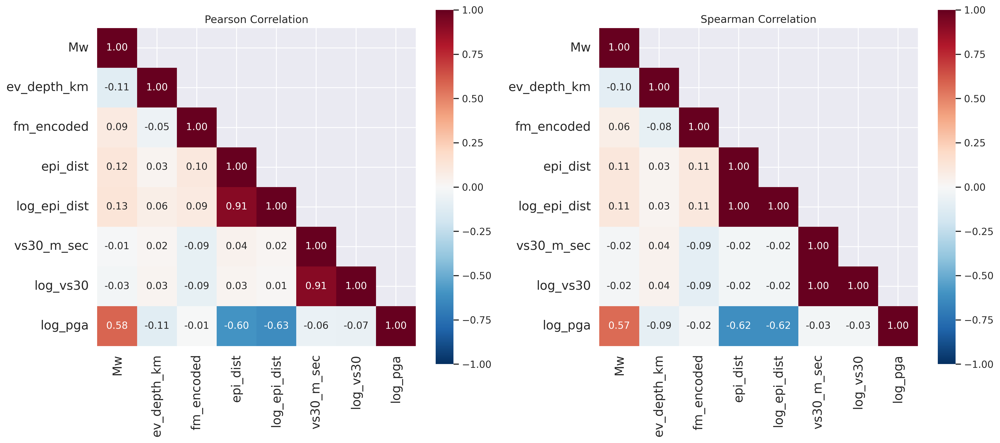


Key Correlations (|r| > 0.7):
   epi_dist - log_epi_dist: r = 0.908
   vs30_m_sec - log_vs30: r = 0.912


In [75]:
# Correlation analysis
pearson_corr = df_train_feature_engineered[FEATURE_COLS+[TARGET_COL]].corr(method='pearson')
spearman_corr = df_train_feature_engineered[FEATURE_COLS+[TARGET_COL]].corr(method='spearman')

fig, axes = plt.subplots(1, 2, figsize=(16, 7))

ax1 = axes[0]
mask = np.triu(np.ones_like(pearson_corr, dtype=bool), k=1)
g = gs.heatmap(pearson_corr, mask=mask, annot=True, fmt='.2f', cmap='RdBu_r', 
            center=0, vmin=-1, vmax=1, ax=ax1, square=True,
            annot_kws={'size': 11})
g.set_xticklabels(g.get_xmajorticklabels(), fontsize = 14)
g.set_yticklabels(g.get_ymajorticklabels(), fontsize = 14)
ax1.set_title('Pearson Correlation')

ax2 = axes[1]
g = gs.heatmap(spearman_corr, mask=mask, annot=True, fmt='.2f', cmap='RdBu_r', 
            center=0, vmin=-1, vmax=1, ax=ax2, square=True,
            annot_kws={'size': 11})
g.set_xticklabels(g.get_xmajorticklabels(), fontsize = 14)
g.set_yticklabels(g.get_ymajorticklabels(), fontsize = 14)
ax2.set_title('Spearman Correlation')

plt.tight_layout()
plt.savefig(FIGURES_PATH / 'eda' / 'correlation_matrix.png', dpi=150, bbox_inches='tight')
plt.show()

print("\nKey Correlations (|r| > 0.7):")
for i in range(len(pearson_corr.columns)):
    for j in range(i+1, len(pearson_corr.columns)):
        r = pearson_corr.iloc[i, j]
        if abs(r) > 0.7:
            print(f"   {pearson_corr.columns[i]} - {pearson_corr.columns[j]}: r = {r:.3f}")

In [76]:
FEATURE_COLS =  ['Mw', 'ev_depth_km', 'fm_encoded', 'log_epi_dist', 'log_vs30']
TARGET_COL = 'log_pga'

In [77]:
df_train_feature_engineered.head()

,event_id,Mw,ev_depth_km,fm_encoded,epi_dist,vs30_m_sec,log_pga,log_epi_dist,log_vs30
0,EMSC-20080613_0000091,6.9,5.0,2,90.9,475.0,1.648259,1.963316,2.676694
1,EMSC-20080613_0000091,6.9,5.0,2,75.2,620.0,1.847778,1.881955,2.792392
2,EMSC-20080613_0000091,6.9,5.0,2,68.5,320.0,1.874554,1.841985,2.505150
3,EMSC-20080613_0000091,6.9,5.0,2,48.9,829.0,1.890047,1.698101,2.918555
4,EMSC-20080613_0000091,6.9,5.0,2,33.8,455.0,2.251602,1.541579,2.658011


     Feature      VIF
          Mw 1.031266
  fm_encoded 1.031214
log_epi_dist 1.028574
 ev_depth_km 1.018144
    log_vs30 1.007753


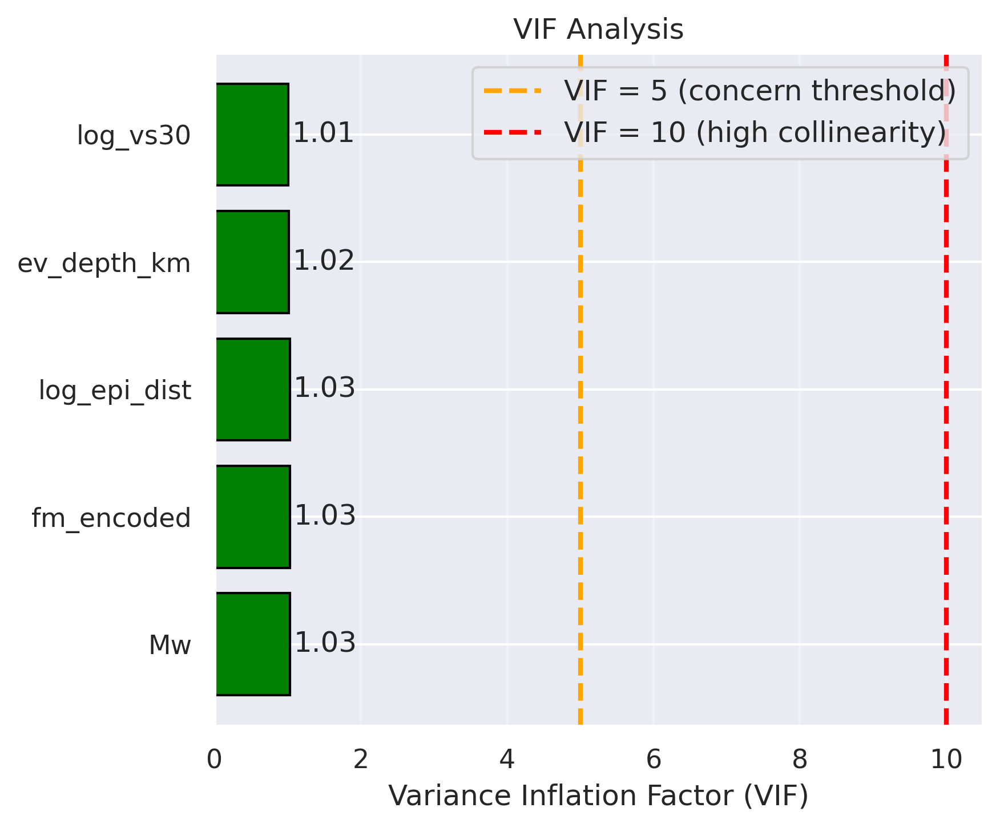

In [78]:
# Multicollinearity analysis using Variance Inflation Factor (VIF)

def calculate_vif(df_features):
    vif_data = pd.DataFrame()
    vif_data["Feature"] = df_features.columns
    vif_data["VIF"] = [variance_inflation_factor(df_features.values, i) 
                       for i in range(df_features.shape[1])]
    return vif_data.sort_values('VIF', ascending=False)


df_train_vif = df_train_feature_engineered[FEATURE_COLS+[TARGET_COL]].copy()
vif_features = df_train_vif[['Mw', 'ev_depth_km', 'log_epi_dist', 'fm_encoded', 'log_vs30']]
vif_features_scaled = pd.DataFrame(
    RobustScaler().fit_transform(vif_features), 
    columns=vif_features.columns
)
vif_result = calculate_vif(vif_features_scaled)
print(vif_result.to_string(index=False))

fig, ax = plt.subplots(figsize=(6, 5))
colors = ['green' if v < 5 else 'orange' if v < 10 else 'red' for v in vif_result['VIF']]
bars = ax.barh(vif_result['Feature'], vif_result['VIF'], color=colors, edgecolor='black')
ax.axvline(5, color='orange', linestyle='--', linewidth=2, label='VIF = 5 (concern threshold)')
ax.axvline(10, color='red', linestyle='--', linewidth=2, label='VIF = 10 (high collinearity)')
ax.set_xlabel('Variance Inflation Factor (VIF)')
ax.set_title('VIF Analysis')
ax.legend(loc='upper right', fontsize=12)
ax.grid(True, alpha=0.3, axis='x')

for bar, vif_val in zip(bars, vif_result['VIF']):
    ax.text(bar.get_width() + 0.05, bar.get_y() + bar.get_height()/2, 
            f'{vif_val:.2f}', va='center', fontsize=12)

plt.tight_layout()
plt.savefig(FIGURES_PATH / 'eda' / 'vif_analysis.png', dpi=300, bbox_inches='tight')
plt.show()

VIF Interpretation:
- VIF < 5:  Acceptable (low collinearity)
- 5 ≤ VIF < 10: Moderate concern (justify if kept)
- VIF ≥ 10: High collinearity (remove or replace)

All features have VIF < 5 after standardization -> No multicollinearity issues

## 3.6 Final Features

In [79]:
FEATURE_COLS = ['Mw', 'ev_depth_km', 'log_epi_dist', 'log_vs30', 'fm_encoded']
TARGET_COL = 'log_pga'

## 3.7 Data Transformer

In [80]:
df_train_missing_handled['vs30_m_sec'].median()

453.0

In [81]:
def transform_dataset(df):
    data = df.copy()

    # Initial features
    source = ['Mw', 'ev_depth_km', 'fm_type_code', 'es_strike', 'es_dip', 'es_rake']
    distance = ['epi_dist', 'JB_dist', 'rup_dist', 'Rx_dist', 'Ry0_dist']
    site = ['vs30_m_sec', 'ec8_code']
    features = source + distance + site
    target = 'rotD50_pga'

    # Categorical encoding
    fm_mapping = {'NF': 0, 'SS': 1, 'TF': 2, 'U': 0}
    ec8_mapping = {'A': 0, 'B': 1, 'C': 2, 'D': 3, 'E': 4, 'A*': 0, 'B*': 1, 'C*': 2, 'D*': 3, 'E*': 4}
    data['fm_encoded'] = data['fm_type_code'].map(fm_mapping)
    data['ec8_encoded'] = data['ec8_code'].map(ec8_mapping)

    # Missing value handling
    data['vs30_m_sec'] = data['vs30_m_sec'].fillna(453)

    # Feature Engineering
    data['log_pga'] = np.log10(data['rotD50_pga'])
    data['log_epi_dist'] = np.log10(data['epi_dist'] + 1)
    data['log_vs30'] = np.log10(data['vs30_m_sec'])
    
    # 4. Create event-wise grouping for cross-validation
    event_ids = data['event_id'].unique()
    event_to_group = {eid: i for i, eid in enumerate(event_ids)}
    data['event_group'] = data['event_id'].map(event_to_group)

    return data

df_train_prepared = transform_dataset(df_train)
df_test_prepared = transform_dataset(df_test)

print(f"\nTraining data shape: {df_train_prepared.shape}")
print(f"Test data shape: {df_test_prepared.shape}")


Training data shape: (5039, 262)
Test data shape: (704, 262)


## 3.8 Cross Validation Split

In [82]:
# =============================================================================
# CROSS-VALIDATION SPLITS
# =============================================================================

def create_event_cv_splits(df, n_splits=5, random_state=42):
    """
    Create event-wise cross-validation splits.
    All records from the same event must be in the same fold.
    """
    groups = df['event_group'].values
    gkf = GroupKFold(n_splits=n_splits)
    
    splits = list(gkf.split(df, groups=groups))
    
    print(f"Created {n_splits} event-wise CV folds:")
    for i, (train_idx, val_idx) in enumerate(splits):
        n_train_events = df.iloc[train_idx]['event_group'].nunique()
        n_val_events = df.iloc[val_idx]['event_group'].nunique()
        print(f"  Fold {i+1}: Train={len(train_idx)} records ({n_train_events} events), "
              f"Val={len(val_idx)} records ({n_val_events} events)")
    
    return splits

print(f"Train Set: {len(df_train_prepared)} records from {df_train_prepared['event_group'].nunique()} events")
print(f"  Date range: {df_train_prepared['event_time'].min()} to {df_train_prepared['event_time'].max()}")

print(f"\nTest Set: {len(df_test_prepared)} records from {df_test_prepared['event_group'].nunique()} events")
print(f"  Date range: {df_test_prepared['event_time'].min()} to {df_test_prepared['event_time'].max()}")

total_records = len(df_train_prepared) + len(df_test_prepared)
print(f"\nTest percentage: {len(df_test_prepared) / total_records * 100:.1f}%")

# Create CV splits
CV_SPLITS = create_event_cv_splits(df_train_prepared, n_splits=5, random_state=RANDOM_STATE)

# Prepare final modeling dataframes (drop any NaN in features)
df_model = df_train_prepared[FEATURE_COLS + [TARGET_COL, 'event_group', 'event_id']].dropna()
df_holdout_model = df_test_prepared[FEATURE_COLS + [TARGET_COL, 'event_group', 'event_id']].dropna()

# Store event IDs for reference
train_event_ids = df_train_prepared['event_id'].unique()
test_event_ids = df_test_prepared['event_id'].unique()

print(f"\nFinal Training dataset: {len(df_model)} records")
print(f"Final Test dataset: {len(df_holdout_model)} records")

Train Set: 5039 records from 150 events
  Date range: 1976-05-06 20:00:12 to 2016-10-26 19:18:06

Test Set: 704 records from 5 events
  Date range: 2016-10-30 06:40:18 to 2016-11-13 11:02:58

Test percentage: 12.3%
Created 5 event-wise CV folds:
  Fold 1: Train=4031 records (120 events), Val=1008 records (30 events)
  Fold 2: Train=4031 records (120 events), Val=1008 records (30 events)
  Fold 3: Train=4031 records (120 events), Val=1008 records (30 events)
  Fold 4: Train=4031 records (120 events), Val=1008 records (30 events)
  Fold 5: Train=4032 records (120 events), Val=1007 records (30 events)

Final Training dataset: 5039 records
Final Test dataset: 704 records


## 3.9 Feature Scaling

In [83]:
# Prepare data for modeling
X = df_model[FEATURE_COLS]
y_pga = df_model[TARGET_COL]  # Target: log10(PGA in cm/s²)
groups = df_model['event_group']

# Create and fit scaler on TRAINING DATA ONLY (proper ML practice)
# This scaler will be used for neural networks and any models requiring scaled inputs
scaler_path = MODELS_PATH / 'robust_scaler.joblib'

if scaler_path.exists():
    print("Loading existing scaler...")
    scaler = joblib.load(scaler_path)
    X_scaled = scaler.transform(X.values)
else:
    print("Fitting new scaler on training data...")
    scaler = RobustScaler()
    X_scaled = scaler.fit_transform(X.values)
    # Save scaler using joblib
    joblib.dump(scaler, scaler_path)
    print(f"Scaler saved to {scaler_path}")

print(f"\nFeatures: {FEATURE_COLS}")
print(f"Target: {TARGET_COL}")
print(f"X shape: {X.shape}")
print(f"y shape: {y_pga.shape}")
print(f"\nRobustScaler (fit on training data X)")
print(f"  Scaler center: {scaler.center_}")
print(f"  Scaler scale:  {scaler.scale_}")

Fitting new scaler on training data...
Scaler saved to /home/ghiffaryr/Physics-Constrained-Machine-Learning-for-Seismic-Risk-Assessment-in-Italy/models/robust_scaler.joblib

Features: ['Mw', 'ev_depth_km', 'log_epi_dist', 'log_vs30', 'fm_encoded']
Target: log_pga
X shape: (5039, 5)
y shape: (5039,)

RobustScaler (fit on training data X)
  Scaler center: [5.1        9.1        1.82347423 2.6560982  1.        ]
  Scaler scale:  [1.6        3.23       0.53538564 1.         2.        ]


# Phase 4: Modeling

## 4.0 Helper Functions for Model Training and Evaluation

In [84]:
def train_evaluate_model(model, X, y, groups, cv_splits, model_name):
    predictions = np.zeros(len(y))
    fold_metrics = []
    
    for fold, (train_idx, test_idx) in enumerate(cv_splits):
        X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
        y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]
        
        model_clone = model.__class__(**model.get_params()) if hasattr(model, 'get_params') else model
        model_clone.fit(X_train, y_train)
        y_pred = model_clone.predict(X_test)
        predictions[test_idx] = y_pred
        
        rmse = np.sqrt(mean_squared_error(y_test, y_pred))
        mae = mean_absolute_error(y_test, y_pred)
        r2 = r2_score(y_test, y_pred)
        fold_metrics.append({'fold': fold+1, 'rmse': rmse, 'mae': mae, 'r2': r2})
    
    overall_rmse = np.sqrt(mean_squared_error(y, predictions))
    overall_mae = mean_absolute_error(y, predictions)
    overall_r2 = r2_score(y, predictions)
    
    rmse_std = np.std([f['rmse'] for f in fold_metrics])
    mae_std = np.std([f['mae'] for f in fold_metrics])
    r2_std = np.std([f['r2'] for f in fold_metrics])
    
    model.fit(X, y)
    
    return {
        'model_name': model_name,
        'predictions': predictions,
        'overall_metrics': {
            'rmse': overall_rmse, 'rmse_std': rmse_std,
            'mae': overall_mae, 'mae_std': mae_std,
            'r2': overall_r2, 'r2_std': r2_std
        },
        'fold_metrics': fold_metrics,
        'model': model
    }

In [85]:
def compute_cv_predictions(model_class, best_params, X, y, cv_splits, fit_kwargs=None):
    fit_kwargs = fit_kwargs or {}
    predictions = np.zeros(len(y))
    fold_metrics = []
    
    for train_idx, test_idx in cv_splits:
        X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
        y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]
        
        model = model_class(**best_params)
        model.fit(X_train, y_train, **fit_kwargs)
        predictions[test_idx] = model.predict(X_test)
        
        fold_metrics.append({
            'rmse': np.sqrt(mean_squared_error(y_test, predictions[test_idx])),
            'mae': mean_absolute_error(y_test, predictions[test_idx]),
            'r2': r2_score(y_test, predictions[test_idx])
        })
    
    overall_metrics = compute_metrics(y, predictions)
    overall_metrics['rmse_std'] = np.std([f['rmse'] for f in fold_metrics])
    overall_metrics['mae_std'] = np.std([f['mae'] for f in fold_metrics])
    overall_metrics['r2_std'] = np.std([f['r2'] for f in fold_metrics])
    
    return predictions, overall_metrics


def compute_metrics(y_true, y_pred):
    return {
        'rmse': np.sqrt(mean_squared_error(y_true, y_pred)),
        'mae': mean_absolute_error(y_true, y_pred),
        'r2': r2_score(y_true, y_pred)
    }

In [86]:
def tune_and_train_sklearn_model(model_path, model_class, param_space_fn, model_name, 
                                  fixed_params=None, n_trials=30):
    fixed_params = fixed_params or {}
    
    if model_path.exists():
        print(f"Loading existing {model_name}...")
        saved_data = joblib.load(model_path)
        model = saved_data['model']
        best_params = saved_data.get('best_params', {})
        
        print(f"Computing CV predictions...")
        predictions, metrics = compute_cv_predictions(
            model_class, {**best_params, **fixed_params}, X, y_pga, CV_SPLITS
        )
        print(f"CV RMSE: {metrics['rmse']:.4f} ± {metrics.get('rmse_std', 0):.4f}")
        print(f"CV MAE: {metrics['mae']:.4f} ± {metrics.get('mae_std', 0):.4f}")
        print(f"CV R²: {metrics['r2']:.4f} ± {metrics.get('r2_std', 0):.4f}")
        
        return {
            'model_name': model_name,
            'predictions': predictions,
            'overall_metrics': metrics,
            'model': model,
            'best_params': best_params
        }
    
    print(f"Tuning {model_name}...")
    
    def objective(trial):
        params = {**param_space_fn(trial), **fixed_params}
        _, metrics = compute_cv_predictions(model_class, params, X, y_pga, CV_SPLITS)
        return metrics['rmse']
    
    sampler = optuna.samplers.TPESampler(seed=RANDOM_STATE)
    study = optuna.create_study(direction='minimize', sampler=sampler)
    study.optimize(objective, n_trials=n_trials, show_progress_bar=True)
    best_params = study.best_params
    print(f"Best params: {best_params}")
    
    # Train final model
    final_params = {**best_params, **fixed_params}
    model = model_class(**final_params)
    results = train_evaluate_model(model, X, y_pga, groups, CV_SPLITS, model_name)
    results['best_params'] = best_params
    print(f"Final CV RMSE: {results['overall_metrics']['rmse']:.4f} ± {results['overall_metrics'].get('rmse_std', 0):.4f}")
    print(f"Final CV MAE: {results['overall_metrics']['mae']:.4f} ± {results['overall_metrics'].get('mae_std', 0):.4f}")
    print(f"Final CV R²: {results['overall_metrics']['r2']:.4f} ± {results['overall_metrics'].get('r2_std', 0):.4f}")
    
    # Save
    joblib.dump({'model': results['model'], 'best_params': best_params}, model_path)
    print(f"  {model_name} saved")
    
    return results

In [87]:
# Store all model results
all_results = {}

## 4.1 Baseline Model: Linear GMPE-style Regression

In [88]:
# Baseline Model: Linear GMPE (Ridge Regression)
baseline_model_path = MODELS_PATH / 'baseline_model.pkl'

if baseline_model_path.exists():
    print("Loading existing baseline model...")
    saved_data = joblib.load(baseline_model_path)
    baseline_model = saved_data['model']
    best_alpha = saved_data.get('best_alpha', 1.0)
    
    print(f"Computing CV predictions...")
    predictions, metrics = compute_cv_predictions(
        Ridge, {'alpha': best_alpha}, X, y_pga, CV_SPLITS
    )
    
    all_results['baseline'] = {
        'model_name': 'Linear GMPE (Ridge)',
        'predictions': predictions,
        'overall_metrics': metrics,
        'model': baseline_model,
        'best_params': {'alpha': best_alpha}
    }
    print(f"CV RMSE: {metrics['rmse']:.4f} ± {metrics.get('rmse_std', 0):.4f}")
    print(f"CV MAE: {metrics['mae']:.4f} ± {metrics.get('mae_std', 0):.4f}")
    print(f"CV R²: {metrics['r2']:.4f} ± {metrics.get('r2_std', 0):.4f}")
    
else:
    print("Training new baseline model with hyperparameter tuning...")
    
    def ridge_objective(trial):
        alpha = trial.suggest_float('alpha', 0.001, 100.0, log=True)
        _, metrics = compute_cv_predictions(Ridge, {'alpha': alpha}, X, y_pga, CV_SPLITS)
        return metrics['rmse']
    
    study = optuna.create_study(direction='minimize')
    study.optimize(ridge_objective, n_trials=50, show_progress_bar=True)
    best_alpha = study.best_params['alpha']
    print(f"  Best alpha: {best_alpha:.4f}")
    
    baseline_model = Ridge(alpha=best_alpha)
    all_results['baseline'] = train_evaluate_model(baseline_model, X, y_pga, groups, CV_SPLITS, 'Linear GMPE (Ridge)')
    all_results['baseline']['best_params'] = {'alpha': best_alpha}
    
    joblib.dump({'model': all_results['baseline']['model'], 'best_alpha': best_alpha}, baseline_model_path)
    print(f"\nBaseline model saved")

Training new baseline model with hyperparameter tuning...


  0%|          | 0/50 [00:00<?, ?it/s]

  Best alpha: 1.5577

Baseline model saved


In [89]:
print("BASELINE MODEL: Linear GMPE (Ridge Regression)")
print(f"\nCoefficients (GMPE interpretation):")
coef_df = pd.DataFrame({
    'Feature': FEATURE_COLS,
    'Coefficient': all_results['baseline']['model'].coef_
}).sort_values('Coefficient', key=abs, ascending=False)
print(coef_df.to_string(index=False))
print(f"Intercept: {all_results['baseline']['model'].intercept_:.4f}")

BASELINE MODEL: Linear GMPE (Ridge Regression)

Coefficients (GMPE interpretation):
     Feature  Coefficient
log_epi_dist    -1.730661
          Mw     0.683137
    log_vs30    -0.325250
  fm_encoded    -0.002732
 ev_depth_km     0.001254
Intercept: 1.0621


In [90]:
all_results['baseline']['best_params']

{'alpha': 1.5577333494342525}

## 4.1b Gaussian Process Regression (GPR)

In [91]:
# GPR Model (Lucia et al. 2023 comparison with EVENT-BASED CV)
gpr_model_path = MODELS_PATH / 'gpr_model.pkl'

In [92]:
if gpr_model_path.exists():
    print("Loading existing GPR model...")
    saved_data = joblib.load(gpr_model_path)
    gpr_model = saved_data['model']
    best_params = saved_data.get('best_params', {})
    
    print(f"Computing CV predictions with event-based GroupKFold...")
    predictions = np.zeros(len(y_pga))
    fold_metrics = []
    
    for fold, (train_idx, test_idx) in enumerate(CV_SPLITS):
        X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
        y_train, y_test = y_pga.iloc[train_idx], y_pga.iloc[test_idx]
        
        # Recreate kernel for each fold
        kernel = C(1.0) * RBF(length_scale=best_params['length_scale']) + WhiteKernel(noise_level=best_params['noise_level'])
        gpr_fold = GaussianProcessRegressor(
            kernel=kernel,
            n_restarts_optimizer=best_params['n_restarts_optimizer'],
            random_state=RANDOM_STATE,
            normalize_y=True
        )
        gpr_fold.fit(X_train, y_train)
        y_pred = gpr_fold.predict(X_test)
        predictions[test_idx] = y_pred
        
        rmse = np.sqrt(mean_squared_error(y_test, y_pred))
        mae = mean_absolute_error(y_test, y_pred)
        r2 = r2_score(y_test, y_pred)
        fold_metrics.append({'rmse': rmse, 'mae': mae, 'r2': r2})
    
    # Compute overall metrics
    overall_metrics = compute_metrics(y_pga, predictions)
    overall_metrics['rmse_std'] = np.std([f['rmse'] for f in fold_metrics])
    overall_metrics['mae_std'] = np.std([f['mae'] for f in fold_metrics])
    overall_metrics['r2_std'] = np.std([f['r2'] for f in fold_metrics])
    
    all_results['gpr'] = {
        'model_name': 'GPR',
        'predictions': predictions,
        'overall_metrics': overall_metrics,
        'fold_metrics': fold_metrics,
        'model': gpr_model,
        'best_params': best_params
    }
    print(f"CV RMSE: {overall_metrics['rmse']:.4f} ± {overall_metrics.get('rmse_std', 0):.4f}")
    print(f"CV MAE: {overall_metrics['mae']:.4f} ± {overall_metrics.get('mae_std', 0):.4f}")
    print(f"CV R²: {overall_metrics['r2']:.4f} ± {overall_metrics.get('r2_std', 0):.4f}")
    
else:
    # GPR is computationally expensive - using reduced hyperparameter search
    print("Training new GPR model with event-based CV...")
    
    # Optuna hyperparameter tuning
    def gpr_objective(trial):
        length_scale = trial.suggest_float('length_scale', 0.1, 2.0)
        noise_level = trial.suggest_float('noise_level', 1e-5, 1e-2, log=True)
        
        kernel = C(1.0) * RBF(length_scale=length_scale) + WhiteKernel(noise_level=noise_level)
        model = GaussianProcessRegressor(
            kernel=kernel,
            n_restarts_optimizer=3,
            random_state=RANDOM_STATE,
            normalize_y=True
        )
        
        # Single-fold validation to speed up
        train_idx, test_idx = CV_SPLITS[0]
        X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
        y_train, y_test = y_pga.iloc[train_idx], y_pga.iloc[test_idx]
        
        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)
        rmse = np.sqrt(mean_squared_error(y_test, y_pred))
        
        return rmse
    
    study = optuna.create_study(direction='minimize', sampler=optuna.samplers.TPESampler(seed=RANDOM_STATE))
    study.optimize(gpr_objective, n_trials=20, show_progress_bar=True)
    
    best_params = study.best_params
    print(f"\nBest length_scale: {best_params['length_scale']:.4f}")
    print(f"Best noise_level: {best_params['noise_level']:.6f}")
    
    # Train final model with event-based CV
    predictions = np.zeros(len(y_pga))
    fold_metrics = []
    trained_model = None
    
    print("\nPerforming event-based cross-validation...")
    for fold, (train_idx, test_idx) in enumerate(CV_SPLITS):
        X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
        y_train, y_test = y_pga.iloc[train_idx], y_pga.iloc[test_idx]
        
        # Create fresh GPR model for each fold
        gpr_fold = GaussianProcessRegressor(
            kernel=C(1.0) * RBF(length_scale=best_params['length_scale']) + WhiteKernel(noise_level=best_params['noise_level']),
            n_restarts_optimizer=5,
            random_state=RANDOM_STATE,
            normalize_y=True
        )
        
        gpr_fold.fit(X_train, y_train)
        y_pred = gpr_fold.predict(X_test)
        predictions[test_idx] = y_pred
        
        rmse = np.sqrt(mean_squared_error(y_test, y_pred))
        mae = mean_absolute_error(y_test, y_pred)
        r2 = r2_score(y_test, y_pred)
        fold_metrics.append({'rmse': rmse, 'mae': mae, 'r2': r2})
        
        if fold == len(CV_SPLITS) - 1:
            trained_model = gpr_fold  # Keep last fold's model
        
        print(f"Fold {fold+1}: RMSE = {rmse:.4f}, MAE = {mae:.4f}, R² = {r2:.4f}")
    
    # Compute overall metrics
    overall_metrics = compute_metrics(y_pga, predictions)
    overall_metrics['rmse_std'] = np.std([f['rmse'] for f in fold_metrics])
    overall_metrics['mae_std'] = np.std([f['mae'] for f in fold_metrics])
    overall_metrics['r2_std'] = np.std([f['r2'] for f in fold_metrics])
    
    all_results['gpr'] = {
        'model_name': 'GPR (Event-based CV)',
        'predictions': predictions,
        'overall_metrics': overall_metrics,
        'fold_metrics': fold_metrics,
        'model': trained_model,
        'best_params': {
            'length_scale': best_params['length_scale'],
            'noise_level': best_params['noise_level'],
            'n_restarts_optimizer': 5,
            'random_state': RANDOM_STATE,
            'normalize_y': True
        }
    }
    
    joblib.dump({
        'model': trained_model, 
        'best_params': all_results['gpr']['best_params']
    }, gpr_model_path)
    
    print(f"\nGPR model saved to: {gpr_model_path}")
    print(f"CV RMSE: {overall_metrics['rmse']:.4f} ± {overall_metrics['rmse_std']:.4f}")
    print(f"CV MAE: {overall_metrics['mae']:.4f} ± {overall_metrics['mae_std']:.4f}")
    print(f"CV R²: {overall_metrics['r2']:.4f} ± {overall_metrics['r2_std']:.4f}")

Training new GPR model with event-based CV...


  0%|          | 0/20 [00:00<?, ?it/s]


Best length_scale: 1.6816
Best noise_level: 0.000043

Performing event-based cross-validation...
Fold 1: RMSE = 0.6328, MAE = 0.5197, R² = 0.5306
Fold 2: RMSE = 0.6302, MAE = 0.4892, R² = 0.5744
Fold 3: RMSE = 0.6079, MAE = 0.4903, R² = 0.5696
Fold 4: RMSE = 0.4823, MAE = 0.3916, R² = 0.7065
Fold 5: RMSE = 0.5319, MAE = 0.4179, R² = 0.6574

GPR model saved to: /home/ghiffaryr/Physics-Constrained-Machine-Learning-for-Seismic-Risk-Assessment-in-Italy/models/gpr_model.pkl
CV RMSE: 0.5801 ± 0.0598
CV MAE: 0.4618 ± 0.0485
CV R²: 0.6117 ± 0.0644


In [93]:
all_results['gpr']['best_params']

{'length_scale': 1.6816410175208014,
 'noise_level': 4.335281794951564e-05,
 'n_restarts_optimizer': 5,
 'random_state': 42,
 'normalize_y': True}

COMPARISON: Lucia et al. (2023) vs This Study
Lucia et al. (2023):
  - Model: GPR with RBF kernel
  - CV Strategy: 5-Fold K-Fold (random splits)
  - Result: RMSE = 0.307

    ISSUE: K-Fold splits EVENTS across folds
     - Same event can appear in training AND test folds
     - Model learns event-specific patterns (τ = 0.228)
     - Unrealistic for operational use (new earthquakes)


This Study:
  - Model: GPR with same RBF kernel
  - CV Strategy: Event-based GroupKFold
  - Result: RMSE = 0.5801
  
    Event-based CV: Entire events in train OR test (not both)
     - Cannot learn event-specific patterns
     - Realistic for operational forecasting


Conclusion:
Higher RMSE (0.5801 vs 0.307) is EXPECTED because we use proper CV that prevents data leakage.
Our result represents REAL operational performance.

## 4.2 Tree-Based Models with Monotonic Constraints

In [94]:
# MONOTONIC CONSTRAINTS (Physics-based)
# Mw: +1 (increasing - larger magnitude → larger shaking)
# ev_depth_km: -1 (decreasing - deeper → less surface shaking)
# log_epi_dist: -1 (decreasing - farther → less shaking)
# log_vs30: -1 (decreasing - harder rock → less amplification)
# fm_encoded: 0 (no constraint - categorical)

MONOTONIC_CONSTRAINTS = [1, -1, -1, -1, 0]  # For XGBoost/LightGBM
MONOTONIC_CONSTRAINTS_STR = '(1,-1,-1,-1,0)'  # For CatBoost

In [95]:
# RF
def rf_param_space(trial):
    return {
        'n_estimators': trial.suggest_int('n_estimators', 100, 500),
        'max_depth': trial.suggest_int('max_depth', 5, 25),
        'min_samples_leaf': trial.suggest_int('min_samples_leaf', 2, 20),
        'min_samples_split': trial.suggest_int('min_samples_split', 2, 20),
    }

all_results['rf'] = tune_and_train_sklearn_model(
    model_path=MODELS_PATH / 'rf_model.pkl',
    model_class=RandomForestRegressor,
    param_space_fn=rf_param_space,
    model_name='Random Forest',
    fixed_params={'random_state': RANDOM_STATE, 'n_jobs': -1},
    n_trials=30
)

Tuning Random Forest...


  0%|          | 0/30 [00:00<?, ?it/s]

Best params: {'n_estimators': 162, 'max_depth': 8, 'min_samples_leaf': 3, 'min_samples_split': 18}
Final CV RMSE: 0.3663 ± 0.0077
Final CV MAE: 0.2915 ± 0.0052
Final CV R²: 0.8451 ± 0.0130
  Random Forest saved


In [96]:
all_results['rf']

{'model_name': 'Random Forest',
 'predictions': array([1.68271743, 1.68401288, 1.78299105, ..., 1.80949732, 1.85792373,
        1.88004353]),
 'overall_metrics': {'rmse': 0.3663245415757073,
  'rmse_std': 0.007705295032462814,
  'mae': 0.29145966519140465,
  'mae_std': 0.005197809735030011,
  'r2': 0.8451477323239847,
  'r2_std': 0.012984767473015805},
 'fold_metrics': [{'fold': 1,
   'rmse': 0.3626162170361369,
   'mae': 0.28861834705352124,
   'r2': 0.845843678172304},
  {'fold': 2,
   'rmse': 0.3657406352478321,
   'mae': 0.29334184359225257,
   'r2': 0.8566264336645503},
  {'fold': 3,
   'rmse': 0.3657855319242018,
   'mae': 0.28805899918425054,
   'r2': 0.8441823991658063},
  {'fold': 4,
   'rmse': 0.38021099370483064,
   'mae': 0.3007933366264631,
   'r2': 0.8176014501504147},
  {'fold': 5,
   'rmse': 0.3568548256974579,
   'mae': 0.2864808602098796,
   'r2': 0.8457765849304293}],
 'model': RandomForestRegressor(max_depth=8, min_samples_leaf=3, min_samples_split=18,
             

In [97]:
# GBDT
def gbdt_param_space(trial):
    return {
        'n_estimators': trial.suggest_int('n_estimators', 100, 400),
        'max_depth': trial.suggest_int('max_depth', 3, 10),
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.3, log=True),
        'min_samples_leaf': trial.suggest_int('min_samples_leaf', 5, 30),
        'subsample': trial.suggest_float('subsample', 0.6, 1.0),
    }

all_results['gbdt'] = tune_and_train_sklearn_model(
    model_path=MODELS_PATH / 'gbdt_model.pkl',
    model_class=GradientBoostingRegressor,
    param_space_fn=gbdt_param_space,
    model_name='Gradient Boosting',
    fixed_params={'random_state': RANDOM_STATE},
    n_trials=30
)

Tuning Gradient Boosting...


  0%|          | 0/30 [00:00<?, ?it/s]

Best params: {'n_estimators': 254, 'max_depth': 3, 'learning_rate': 0.02378376643079244, 'min_samples_leaf': 26, 'subsample': 0.7890856026631795}
Final CV RMSE: 0.3596 ± 0.0077
Final CV MAE: 0.2877 ± 0.0078
Final CV R²: 0.8508 ± 0.0120
  Gradient Boosting saved


In [98]:
all_results['gbdt']['best_params']

{'n_estimators': 254,
 'max_depth': 3,
 'learning_rate': 0.02378376643079244,
 'min_samples_leaf': 26,
 'subsample': 0.7890856026631795}

In [99]:
# XGB WITH MONOTONIC CONSTRAINTS
xgb_model_path = MODELS_PATH / 'xgb_model.json'
xgb_params_path = MODELS_PATH / 'xgb_params.pkl'

xgb_fixed_params = {
    'monotone_constraints': tuple(MONOTONIC_CONSTRAINTS),
    'random_state': RANDOM_STATE,
    'n_jobs': -1
}

if xgb_model_path.exists():
    print("Loading existing XGBoost model...")
    xgb_model = xgb.XGBRegressor()
    xgb_model.load_model(str(xgb_model_path))
    best_params = {}
    if xgb_params_path.exists():
        best_params = joblib.load(xgb_params_path)
    
    print(f"Computin CV predictions...")
    predictions, metrics = compute_cv_predictions(
        xgb.XGBRegressor, {**best_params, **xgb_fixed_params}, 
        X, y_pga, CV_SPLITS, fit_kwargs={'verbose': False}
    )
    print(f"CV RMSE: {metrics['rmse']:.4f} ± {metrics.get('rmse_std', 0):.4f}")
    print(f"CV MAE: {metrics['mae']:.4f} ± {metrics.get('mae_std', 0):.4f}")
    print(f"CV R²: {metrics['r2']:.4f} ± {metrics.get('r2_std', 0):.4f}")
    
    all_results['xgb'] = {
        'model_name': 'XGBoost (Monotonic)',
        'predictions': predictions,
        'overall_metrics': metrics,
        'model': xgb_model,
        'best_params': best_params
    }
else:
    print("Tuning XGBoost with monotonic constraints...")
    
    def xgb_objective(trial):
        params = {
            'n_estimators': trial.suggest_int('n_estimators', 100, 500),
            'max_depth': trial.suggest_int('max_depth', 3, 10),
            'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.3, log=True),
            'min_child_weight': trial.suggest_int('min_child_weight', 1, 20),
            'subsample': trial.suggest_float('subsample', 0.6, 1.0),
            'colsample_bytree': trial.suggest_float('colsample_bytree', 0.6, 1.0),
            'reg_alpha': trial.suggest_float('reg_alpha', 1e-8, 10.0, log=True),
            'reg_lambda': trial.suggest_float('reg_lambda', 1e-8, 10.0, log=True),
            **xgb_fixed_params
        }
        _, metrics = compute_cv_predictions(
            xgb.XGBRegressor, params, X, y_pga, CV_SPLITS, fit_kwargs={'verbose': False}
        )
        return metrics['rmse']
    
    sampler = optuna.samplers.TPESampler(seed=RANDOM_STATE)
    study = optuna.create_study(direction='minimize', sampler=sampler)
    study.optimize(xgb_objective, n_trials=40, show_progress_bar=True)
    best_params = study.best_params
    print(f"Best params: {best_params}")
    
    # Train final model
    xgb_model = xgb.XGBRegressor(**best_params, **xgb_fixed_params)
    all_results['xgb'] = train_evaluate_model(xgb_model, X, y_pga, groups, CV_SPLITS, 'XGBoost (Monotonic)')
    all_results['xgb']['best_params'] = best_params
    print(f"Final RMSE: {all_results['xgb']['overall_metrics']['rmse']:.4f} ± {all_results['xgb']['overall_metrics'].get('rmse_std', 0):.4f}")
    print(f"Final MAE: {all_results['xgb']['overall_metrics']['mae']:.4f} ± {all_results['xgb']['overall_metrics'].get('mae_std', 0):.4f}")
    print(f"Final R²: {all_results['xgb']['overall_metrics']['r2']:.4f} ± {all_results['xgb']['overall_metrics'].get('r2_std', 0):.4f}")
    
    # Save
    all_results['xgb']['model'].save_model(str(xgb_model_path))
    joblib.dump(best_params, xgb_params_path)
    print("\nXGBoost model saved")

Tuning XGBoost with monotonic constraints...


  0%|          | 0/40 [00:00<?, ?it/s]

Best params: {'n_estimators': 425, 'max_depth': 3, 'learning_rate': 0.02298841934764809, 'min_child_weight': 6, 'subsample': 0.8325469020334321, 'colsample_bytree': 0.9655305223968971, 'reg_alpha': 0.012993405694721955, 'reg_lambda': 0.9693741763232461}
Final RMSE: 0.3585 ± 0.0030
Final MAE: 0.2860 ± 0.0020
Final R²: 0.8517 ± 0.0093

XGBoost model saved


In [100]:
all_results['xgb']['best_params']

{'n_estimators': 425,
 'max_depth': 3,
 'learning_rate': 0.02298841934764809,
 'min_child_weight': 6,
 'subsample': 0.8325469020334321,
 'colsample_bytree': 0.9655305223968971,
 'reg_alpha': 0.012993405694721955,
 'reg_lambda': 0.9693741763232461}

In [101]:
# =============================================================================
# 4. LIGHTGBM WITH MONOTONIC CONSTRAINTS
# =============================================================================
lgbm_model_path = MODELS_PATH / 'lgbm_model.txt'
lgbm_params_path = MODELS_PATH / 'lgbm_params.pkl'

lgbm_fixed_params = {
    'monotone_constraints': MONOTONIC_CONSTRAINTS,
    'random_state': RANDOM_STATE,
    'n_jobs': -1,
    'verbose': -1
}

if lgbm_model_path.exists():
    print("Loading existing LightGBM model...")
    lgbm_model = lgb.Booster(model_file=str(lgbm_model_path))
    best_params = {}
    if lgbm_params_path.exists():
        best_params = joblib.load(lgbm_params_path)
    
    print(f"Computing CV predictions...")
    predictions, metrics = compute_cv_predictions(
        lgb.LGBMRegressor, {**best_params, **lgbm_fixed_params}, X, y_pga, CV_SPLITS
    )
    print(f"CV RMSE: {metrics['rmse']:.4f} ± {metrics.get('rmse_std', 0):.4f}")
    print(f"CV MAE: {metrics['mae']:.4f} ± {metrics.get('mae_std', 0):.4f}")
    print(f"CV R²: {metrics['r2']:.4f} ± {metrics.get('r2_std', 0):.4f}")
    
    all_results['lgbm'] = {
        'model_name': 'LightGBM (Monotonic)',
        'predictions': predictions,
        'overall_metrics': metrics,
        'model': lgbm_model,
        'best_params': best_params
    }
else:
    print("Tuning LightGBM with monotonic constraints...")
    
    def lgbm_objective(trial):
        params = {
            'n_estimators': trial.suggest_int('n_estimators', 100, 500),
            'max_depth': trial.suggest_int('max_depth', 3, 12),
            'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.3, log=True),
            'num_leaves': trial.suggest_int('num_leaves', 20, 150),
            'min_child_samples': trial.suggest_int('min_child_samples', 10, 50),
            'subsample': trial.suggest_float('subsample', 0.6, 1.0),
            'colsample_bytree': trial.suggest_float('colsample_bytree', 0.6, 1.0),
            'reg_alpha': trial.suggest_float('reg_alpha', 1e-8, 10.0, log=True),
            'reg_lambda': trial.suggest_float('reg_lambda', 1e-8, 10.0, log=True),
            **lgbm_fixed_params
        }
        _, metrics = compute_cv_predictions(lgb.LGBMRegressor, params, X, y_pga, CV_SPLITS)
        return metrics['rmse']
    
    sampler = optuna.samplers.TPESampler(seed=RANDOM_STATE)
    study = optuna.create_study(direction='minimize', sampler=sampler)
    study.optimize(lgbm_objective, n_trials=40, show_progress_bar=True)
    best_params = study.best_params
    print(f"Best params: {best_params}")
    
    # Train final model
    lgbm_model = lgb.LGBMRegressor(**best_params, **lgbm_fixed_params)
    all_results['lgbm'] = train_evaluate_model(lgbm_model, X, y_pga, groups, CV_SPLITS, 'LightGBM (Monotonic)')
    all_results['lgbm']['best_params'] = best_params
    print(f"Final RMSE: {all_results['lgbm']['overall_metrics']['rmse']:.4f} ± {all_results['lgbm']['overall_metrics'].get('rmse_std', 0):.4f}")
    print(f"Final MAE: {all_results['lgbm']['overall_metrics']['mae']:.4f} ± {all_results['lgbm']['overall_metrics'].get('mae_std', 0):.4f}")
    print(f"Final R²: {all_results['lgbm']['overall_metrics']['r2']:.4f} ± {all_results['lgbm']['overall_metrics'].get('r2_std', 0):.4f}")
    
    # Save
    all_results['lgbm']['model'].booster_.save_model(str(lgbm_model_path))
    joblib.dump(best_params, lgbm_params_path)
    print("\nLightGBM model saved")

Tuning LightGBM with monotonic constraints...


  0%|          | 0/40 [00:00<?, ?it/s]

Best params: {'n_estimators': 191, 'max_depth': 10, 'learning_rate': 0.19099344553035713, 'num_leaves': 104, 'min_child_samples': 45, 'subsample': 0.6876417350588806, 'colsample_bytree': 0.7291204714482636, 'reg_alpha': 4.869178648350147e-06, 'reg_lambda': 0.28041293940136697}
Final RMSE: 0.3604 ± 0.0029
Final MAE: 0.2865 ± 0.0035
Final R²: 0.8501 ± 0.0081

LightGBM model saved


In [102]:
all_results['lgbm']['best_params']

{'n_estimators': 191,
 'max_depth': 10,
 'learning_rate': 0.19099344553035713,
 'num_leaves': 104,
 'min_child_samples': 45,
 'subsample': 0.6876417350588806,
 'colsample_bytree': 0.7291204714482636,
 'reg_alpha': 4.869178648350147e-06,
 'reg_lambda': 0.28041293940136697}

In [103]:
# CATBOOST WITH MONOTONIC CONSTRAINTS
catboost_model_path = MODELS_PATH / 'catboost_model.cbm'
catboost_params_path = MODELS_PATH / 'catboost_params.pkl'

catboost_fixed_params = {
    'monotone_constraints': MONOTONIC_CONSTRAINTS,
    'random_state': RANDOM_STATE,
    'verbose': 0
}

if catboost_model_path.exists():
    print("Loading existing CatBoost model...")
    catboost_model = cb.CatBoostRegressor()
    catboost_model.load_model(str(catboost_model_path))
    best_params = {}
    if catboost_params_path.exists():
        best_params = joblib.load(catboost_params_path)
    
    print(f"Computing CV predictions...")
    predictions, metrics = compute_cv_predictions(
        cb.CatBoostRegressor, {**best_params, **catboost_fixed_params}, X, y_pga, CV_SPLITS
    )
    print(f"CV RMSE: {metrics['rmse']:.4f} ± {metrics.get('rmse_std', 0):.4f}")
    print(f"CV MAE: {metrics['mae']:.4f} ± {metrics.get('mae_std', 0):.4f}")
    print(f"CV R²: {metrics['r2']:.4f} ± {metrics.get('r2_std', 0):.4f}")
    
    all_results['catboost'] = {
        'model_name': 'CatBoost (Monotonic)',
        'predictions': predictions,
        'overall_metrics': metrics,
        'model': catboost_model,
        'best_params': best_params
    }
else:
    print("Tuning CatBoost with monotonic constraints...")
    
    def catboost_objective(trial):
        params = {
            'iterations': trial.suggest_int('iterations', 100, 500),
            'depth': trial.suggest_int('depth', 3, 10),
            'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.3, log=True),
            'l2_leaf_reg': trial.suggest_float('l2_leaf_reg', 1e-3, 10.0, log=True),
            'subsample': trial.suggest_float('subsample', 0.6, 1.0),
            'colsample_bylevel': trial.suggest_float('colsample_bylevel', 0.6, 1.0),
            'min_data_in_leaf': trial.suggest_int('min_data_in_leaf', 5, 50),
            **catboost_fixed_params
        }
        _, metrics = compute_cv_predictions(cb.CatBoostRegressor, params, X, y_pga, CV_SPLITS)
        return metrics['rmse']
    
    sampler = optuna.samplers.TPESampler(seed=RANDOM_STATE)
    study = optuna.create_study(direction='minimize', sampler=sampler)
    study.optimize(catboost_objective, n_trials=40, show_progress_bar=True)
    best_params = study.best_params
    print(f"Best params: {best_params}")
    
    # Train final model
    catboost_model = cb.CatBoostRegressor(**best_params, **catboost_fixed_params)
    all_results['catboost'] = train_evaluate_model(catboost_model, X, y_pga, groups, CV_SPLITS, 'CatBoost (Monotonic)')
    all_results['catboost']['best_params'] = best_params
    print(f"Final RMSE: {all_results['catboost']['overall_metrics']['rmse']:.4f} ± {all_results['catboost']['overall_metrics'].get('rmse_std', 0):.4f}")
    print(f"Final MAE: {all_results['catboost']['overall_metrics']['mae']:.4f} ± {all_results['catboost']['overall_metrics'].get('mae_std', 0):.4f}")
    print(f"Final R²: {all_results['catboost']['overall_metrics']['r2']:.4f} ± {all_results['catboost']['overall_metrics'].get('r2_std', 0):.4f}")
    
    # Save
    all_results['catboost']['model'].save_model(str(catboost_model_path))
    joblib.dump(best_params, catboost_params_path)
    print("\nCatBoost model saved")

Tuning CatBoost with monotonic constraints...


  0%|          | 0/40 [00:00<?, ?it/s]

Best params: {'iterations': 376, 'depth': 3, 'learning_rate': 0.04452364429911019, 'l2_leaf_reg': 0.005211827115799194, 'subsample': 0.8488073013225127, 'colsample_bylevel': 0.99802070405385, 'min_data_in_leaf': 37}
Final RMSE: 0.3552 ± 0.0048
Final MAE: 0.2829 ± 0.0055
Final R²: 0.8544 ± 0.0104

CatBoost model saved


In [104]:
all_results['catboost']['best_params']

{'iterations': 376,
 'depth': 3,
 'learning_rate': 0.04452364429911019,
 'l2_leaf_reg': 0.005211827115799194,
 'subsample': 0.8488073013225127,
 'colsample_bylevel': 0.99802070405385,
 'min_data_in_leaf': 37}

## 4.3 Deep Learning Model (PyTorch MLP)

In [105]:
# MLP

class GMPM_MLP(nn.Module):
    def __init__(self, input_dim, hidden_dims=[64, 32, 16], dropout_rate=0.2):
        super(GMPM_MLP, self).__init__()
        layers = []
        prev_dim = input_dim
        for hidden_dim in hidden_dims:
            layers.extend([
                nn.Linear(prev_dim, hidden_dim),
                nn.ReLU(),
                nn.Dropout(dropout_rate)
            ])
            prev_dim = hidden_dim
        layers.append(nn.Linear(prev_dim, 1))
        self.network = nn.Sequential(*layers)
        
    def forward(self, x):
        return self.network(x).squeeze()


def train_pytorch_model(model, train_loader, val_loader, criterion, optimizer, 
                        epochs=100, patience=10, device='cpu'):
    model.to(device)
    best_val_loss = float('inf')
    patience_counter = 0
    best_model_state = None
    
    for epoch in range(epochs):
        # Training
        model.train()
        train_loss = sum(
            (optimizer.zero_grad(), 
             (loss := criterion(model(X_batch.to(device)), y_batch.to(device))).backward(),
             optimizer.step(),
             loss.item() * len(y_batch))[3]
            for X_batch, y_batch in train_loader
        ) / len(train_loader.dataset)
        
        # Validation
        model.eval()
        with torch.no_grad():
            val_loss = sum(
                criterion(model(X_batch.to(device)), y_batch.to(device)).item() * len(y_batch)
                for X_batch, y_batch in val_loader
            ) / len(val_loader.dataset)
        
        # Early stopping
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            best_model_state = model.state_dict().copy()
            patience_counter = 0
        else:
            patience_counter += 1
            if patience_counter >= patience:
                break
    
    if best_model_state:
        model.load_state_dict(best_model_state)
    return model


def compute_pytorch_cv_predictions(best_params, X_scaled, y, cv_splits, device):
    predictions = np.zeros(len(y))
    fold_metrics = []
    
    for fold, (train_idx, test_idx) in enumerate(cv_splits):
        # Reset seed for each fold for reproducibility
        set_seed(RANDOM_STATE + fold)
        
        X_train, X_test = X_scaled[train_idx], X_scaled[test_idx]
        y_train, y_test = y.iloc[train_idx].values, y.iloc[test_idx].values
        
        # Use generator for reproducible shuffling
        g = torch.Generator()
        g.manual_seed(RANDOM_STATE + fold)
        
        train_loader = DataLoader(
            TensorDataset(torch.FloatTensor(X_train), torch.FloatTensor(y_train)),
            batch_size=best_params.get('batch_size', 64), shuffle=True, generator=g
        )
        val_loader = DataLoader(
            TensorDataset(torch.FloatTensor(X_test), torch.FloatTensor(y_test)),
            batch_size=best_params.get('batch_size', 64), shuffle=False
        )
        
        model = GMPM_MLP(
            input_dim=X_scaled.shape[1],
            hidden_dims=best_params.get('hidden_dims', [64, 32, 16]),
            dropout_rate=best_params.get('dropout_rate', 0.2)
        )
        optimizer = optim.Adam(
            model.parameters(),
            lr=best_params.get('lr', 1e-3),
            weight_decay=best_params.get('weight_decay', 1e-5)
        )
        
        model = train_pytorch_model(
            model, train_loader, val_loader, nn.MSELoss(), optimizer,
            epochs=200, patience=15, device=device
        )
        
        model.eval()
        with torch.no_grad():
            predictions[test_idx] = model(torch.FloatTensor(X_test).to(device)).cpu().numpy()
        
        fold_rmse = np.sqrt(mean_squared_error(y_test, predictions[test_idx]))
        fold_mae = mean_absolute_error(y_test, predictions[test_idx])
        fold_r2 = r2_score(y_test, predictions[test_idx])
        fold_metrics.append({'rmse': fold_rmse, 'mae': fold_mae, 'r2': fold_r2})
        
        print(f"    Fold {fold+1}: RMSE = {fold_rmse:.4f}")
    
    # Compute overall metrics and standard deviations
    overall_metrics = compute_metrics(y, predictions)
    overall_metrics['rmse_std'] = np.std([f['rmse'] for f in fold_metrics])
    overall_metrics['mae_std'] = np.std([f['mae'] for f in fold_metrics])
    overall_metrics['r2_std'] = np.std([f['r2'] for f in fold_metrics])
    
    return predictions, overall_metrics

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")

pytorch_model_path = MODELS_PATH / 'pytorch_model' / 'model.pt'

if pytorch_model_path.exists():
    print("Loading existing PyTorch MLP model...")
    checkpoint = torch.load(pytorch_model_path, map_location=device, weights_only=False)
    # Use the global scaler (fit on training X) - ignore saved scaler for consistency
    # X_scaled is already computed above using the global scaler
    best_params = checkpoint.get('best_params', {'hidden_dims': [64, 32, 16], 'dropout_rate': 0.2})
    
    pytorch_model = GMPM_MLP(
        input_dim=len(FEATURE_COLS),
        hidden_dims=best_params.get('hidden_dims', [64, 32, 16]),
        dropout_rate=best_params.get('dropout_rate', 0.2)
    )
    pytorch_model.load_state_dict(checkpoint['model_state_dict'])
    pytorch_model.to(device).eval()
    
    print(f"Computing CV predictions...")
    dl_predictions, dl_metrics = compute_pytorch_cv_predictions(best_params, X_scaled, y_pga, CV_SPLITS, device)
    print(f"CV RMSE: {dl_metrics['rmse']:.4f} ± {dl_metrics.get('rmse_std', 0):.4f}")
    print(f"CV MAE: {dl_metrics['mae']:.4f} ± {dl_metrics.get('mae_std', 0):.4f}")
    print(f"CV R²: {dl_metrics['r2']:.4f} ± {dl_metrics.get('r2_std', 0):.4f}")
    
    all_results['pytorch_mlp'] = {
        'model_name': 'PyTorch MLP',
        'predictions': dl_predictions,
        'overall_metrics': dl_metrics,
        'model': pytorch_model,
        'scaler': scaler,  # Use global scaler
        'best_params': best_params
    }
else:
    print("Tuning PyTorch MLP hyperparameters...")
    # Use the global scaler and X_scaled (already computed above)
    
    def pytorch_objective(trial):
        # Reset seed for this trial
        set_seed(RANDOM_STATE + trial.number)
        
        n_layers = trial.suggest_int('n_layers', 2, 4)
        params = {
            'hidden_dims': [trial.suggest_int(f'hidden_dim_{i}', 16, 128) for i in range(n_layers)],
            'dropout_rate': trial.suggest_float('dropout_rate', 0.1, 0.5),
            'lr': trial.suggest_float('lr', 1e-4, 1e-2, log=True),
            'weight_decay': trial.suggest_float('weight_decay', 1e-6, 1e-3, log=True),
            'batch_size': trial.suggest_categorical('batch_size', [32, 64, 128])
        }
        
        cv_scores = []
        for fold_idx, (train_idx, test_idx) in enumerate(CV_SPLITS):
            g = torch.Generator()
            g.manual_seed(RANDOM_STATE + fold_idx)
            
            train_loader = DataLoader(
                TensorDataset(torch.FloatTensor(X_scaled[train_idx]), torch.FloatTensor(y_pga.iloc[train_idx].values)),
                batch_size=params['batch_size'], shuffle=True, generator=g
            )
            val_loader = DataLoader(
                TensorDataset(torch.FloatTensor(X_scaled[test_idx]), torch.FloatTensor(y_pga.iloc[test_idx].values)),
                batch_size=params['batch_size'], shuffle=False
            )
            
            model = GMPM_MLP(len(FEATURE_COLS), params['hidden_dims'], params['dropout_rate'])
            optimizer = optim.Adam(model.parameters(), lr=params['lr'], weight_decay=params['weight_decay'])
            model = train_pytorch_model(model, train_loader, val_loader, nn.MSELoss(), optimizer, 100, 10, device)
            
            model.eval()
            with torch.no_grad():
                preds = model(torch.FloatTensor(X_scaled[test_idx]).to(device)).cpu().numpy()
            cv_scores.append(np.sqrt(mean_squared_error(y_pga.iloc[test_idx], preds)))
        
        return np.mean(cv_scores)
    
    sampler = optuna.samplers.TPESampler(seed=RANDOM_STATE)
    study = optuna.create_study(direction='minimize', sampler=sampler)
    study.optimize(pytorch_objective, n_trials=30, show_progress_bar=True)
    
    # Extract best params
    best_trial = study.best_trial
    best_params = {
        'hidden_dims': [best_trial.params[f'hidden_dim_{i}'] for i in range(best_trial.params['n_layers'])],
        'dropout_rate': best_trial.params['dropout_rate'],
        'lr': best_trial.params['lr'],
        'weight_decay': best_trial.params['weight_decay'],
        'batch_size': best_trial.params['batch_size']
    }
    print(f"Best params: {best_params}")
    
    # Train with CV
    print("\nTraining PyTorch MLP with best params and computing CV predictions...")
    dl_predictions, dl_metrics = compute_pytorch_cv_predictions(best_params, X_scaled, y_pga, CV_SPLITS, device)
    print(f"Final RMSE: {dl_metrics['rmse']:.4f} ± {dl_metrics.get('rmse_std', 0):.4f}")
    print(f"Final MAE: {dl_metrics['mae']:.4f} ± {dl_metrics.get('mae_std', 0):.4f}")
    print(f"Final R²: {dl_metrics['r2']:.4f} ± {dl_metrics.get('r2_std', 0):.4f}")
    
    # Train final model on all data
    set_seed(RANDOM_STATE)  # Reset seed for final training
    g_final = torch.Generator()
    g_final.manual_seed(RANDOM_STATE)
    
    final_train_loader = DataLoader(
        TensorDataset(torch.FloatTensor(X_scaled), torch.FloatTensor(y_pga.values)),
        batch_size=best_params['batch_size'], shuffle=True, generator=g_final
    )
    pytorch_model = GMPM_MLP(len(FEATURE_COLS), best_params['hidden_dims'], best_params['dropout_rate'])
    optimizer = optim.Adam(pytorch_model.parameters(), lr=best_params['lr'], weight_decay=best_params['weight_decay'])
    
    pytorch_model.to(device).train()
    criterion = nn.MSELoss()
    for _ in range(150):
        for X_batch, y_batch in final_train_loader:
            X_batch, y_batch = X_batch.to(device), y_batch.to(device)
            optimizer.zero_grad()
            criterion(pytorch_model(X_batch), y_batch).backward()
            optimizer.step()
    
    # Save
    pytorch_model_path.parent.mkdir(parents=True, exist_ok=True)
    torch.save({
        'model_state_dict': pytorch_model.state_dict(),
        'feature_cols': FEATURE_COLS,
        'best_params': best_params
    }, pytorch_model_path)
    
    all_results['pytorch_mlp'] = {
        'model_name': 'PyTorch MLP',
        'predictions': dl_predictions,
        'overall_metrics': dl_metrics,
        'model': pytorch_model,
        'scaler': scaler,  # Use global scaler
        'best_params': best_params
    }
    print("\nPyTorch MLP model saved")

Using device: cuda
Tuning PyTorch MLP hyperparameters...


  0%|          | 0/30 [00:00<?, ?it/s]

Best params: {'hidden_dims': [125, 110], 'dropout_rate': 0.18493564427131048, 'lr': 0.0002310201887845295, 'weight_decay': 3.549878832196506e-06, 'batch_size': 64}

Training PyTorch MLP with best params and computing CV predictions...
    Fold 1: RMSE = 0.3838
    Fold 2: RMSE = 0.3785
    Fold 3: RMSE = 0.3572
    Fold 4: RMSE = 0.3744
    Fold 5: RMSE = 0.3555
Final RMSE: 0.3701 ± 0.0115
Final MAE: 0.2959 ± 0.0118
Final R²: 0.8420 ± 0.0115

PyTorch MLP model saved


In [106]:
all_results['pytorch_mlp']['best_params']

{'hidden_dims': [125, 110],
 'dropout_rate': 0.18493564427131048,
 'lr': 0.0002310201887845295,
 'weight_decay': 3.549878832196506e-06,
 'batch_size': 64}

# Phase 5: Model Evaluation and Interpretability

## 5.1 Model Comparison

MODEL COMPARISON SUMMARY (Event-wise Cross-Validation)
               Model     RMSE  RMSE_std      MAE  MAE_std       R²   R²_std
CatBoost (Monotonic) 0.355155  0.004768 0.282901 0.005472 0.854447 0.010415
 XGBoost (Monotonic) 0.358519  0.002975 0.286016 0.001964 0.851677 0.009347
   Gradient Boosting 0.359579  0.007743 0.287692 0.007848 0.850798 0.011972
LightGBM (Monotonic) 0.360399  0.002886 0.286521 0.003470 0.850117 0.008084
       Random Forest 0.366325  0.007705 0.291460 0.005198 0.845148 0.012985
         PyTorch MLP 0.370061  0.011482 0.295888 0.011768 0.841973 0.011509
 Linear GMPE (Ridge) 0.377507  0.010780 0.301572 0.010493 0.835549 0.015344
GPR (Event-based CV) 0.580113  0.059825 0.461767 0.048520 0.611661 0.064400


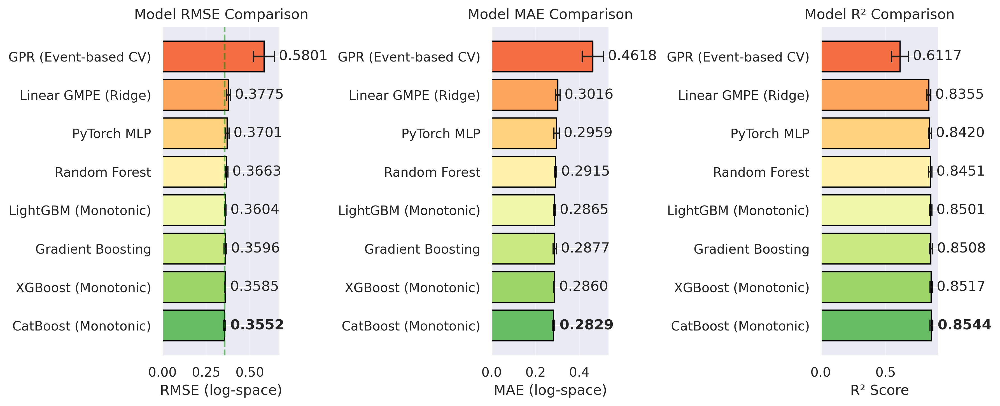


Best Model: CatBoost (Monotonic) (RMSE = 0.3552 ± 0.0048)


In [107]:
# Check if comparison results already exist
comparison_results_path = MODELS_PATH / 'comparison_results.pkl'
model_comparison_fig_path = FIGURES_PATH / 'model_diagnostics' / 'model_comparison.png'

if comparison_results_path.exists():
    print("Loading existing model comparison results...")
    # Load comparison results
    comparison_df = joblib.load(comparison_results_path)
else:
    # Compile all results - use pre-computed standard deviations from CV
    comparison_data = []
    for name, results in all_results.items():
        metrics = results['overall_metrics']
        
        comparison_data.append({
            'Model': results['model_name'],
            'RMSE': metrics['rmse'],
            'RMSE_std': metrics['rmse_std'],
            'MAE': metrics['mae'],
            'MAE_std': metrics['mae_std'],
            'R²': metrics['r2'],
            'R²_std': metrics['r2_std']
        })
    
    comparison_df = pd.DataFrame(comparison_data).sort_values('RMSE')
    comparison_df = comparison_df.reset_index(drop=True)
    
    # Save comparison results
    joblib.dump(comparison_df, comparison_results_path)

print("MODEL COMPARISON SUMMARY (Event-wise Cross-Validation)")
print(comparison_df.to_string(index=False))

# Visualize model comparison
fig, axes = plt.subplots(1, 3, figsize=(12, 5))

# RMSE comparison
ax1 = axes[0]
colors = plt.cm.RdYlGn_r(np.linspace(0.2, 0.8, len(comparison_df)))
bars = ax1.barh(comparison_df['Model'], comparison_df['RMSE'], xerr=comparison_df['RMSE_std'], color=colors, edgecolor='black', capsize=5)
ax1.set_xlabel('RMSE (log-space)')
ax1.set_title('Model RMSE Comparison')
ax1.axvline(comparison_df['RMSE'].min(), color='green', linestyle='--', alpha=0.5)
ax1.grid(True, alpha=0.3, axis='x')
# Add value annotations beside the right edge of bars, bold the best (lowest)
best_rmse = comparison_df['RMSE'].min()
for bar, value, std in zip(bars, comparison_df['RMSE'], comparison_df['RMSE_std']):
    weight = 'bold' if value == best_rmse else 'normal'
    ax1.text(bar.get_width() + std, bar.get_y() + bar.get_height() / 2, 
             f' {value:.4f}', ha='left', va='center', fontsize=12, weight=weight)

# MAE comparison
ax2 = axes[1]
bars = ax2.barh(comparison_df['Model'], comparison_df['MAE'], xerr=comparison_df['MAE_std'], color=colors, edgecolor='black', capsize=5)
ax2.set_xlabel('MAE (log-space)')
ax2.set_title('Model MAE Comparison')
ax2.grid(True, alpha=0.3, axis='x')
# Add value annotations beside the right edge of bars, bold the best (lowest)
best_mae = comparison_df['MAE'].min()
for bar, value, std in zip(bars, comparison_df['MAE'], comparison_df['MAE_std']):
    weight = 'bold' if value == best_mae else 'normal'
    ax2.text(bar.get_width() + std, bar.get_y() + bar.get_height() / 2, 
             f' {value:.4f}', ha='left', va='center', fontsize=12, weight=weight)

# R² comparison
ax3 = axes[2]
bars = ax3.barh(comparison_df['Model'], comparison_df['R²'], xerr=comparison_df['R²_std'], color=colors, edgecolor='black', capsize=5)
ax3.set_xlabel('R² Score')
ax3.set_title('Model R² Comparison')
ax3.grid(True, alpha=0.3, axis='x')
# Add value annotations beside the right edge of bars, bold the best (highest)
best_r2 = comparison_df['R²'].max()
for bar, value, std in zip(bars, comparison_df['R²'], comparison_df['R²_std']):
    weight = 'bold' if value == best_r2 else 'normal'
    ax3.text(bar.get_width() + std, bar.get_y() + bar.get_height() / 2, 
             f' {value:.4f}', ha='left', va='center', fontsize=12, weight=weight)

plt.tight_layout()
plt.savefig(model_comparison_fig_path, dpi=150, bbox_inches='tight')
plt.show()

# Best model identification
best_model_name = comparison_df.iloc[0]['Model']
print(f"\nBest Model: {best_model_name} (RMSE = {comparison_df.iloc[0]['RMSE']:.4f} ± {comparison_df.iloc[0]['RMSE_std']:.4f})")

In [108]:
(0.3775-0.3552) / 0.3552 * 100

6.2781531531531485

## 5.2 Prediction Speed Benchmark

In [109]:
"""
Prediction Speed Benchmark

For earthquake early warning (EEW) applications, prediction latency is critical.
This benchmark measures single-sample prediction time for all 8 models.
"""
import time

print("PREDICTION SPEED BENCHMARK")

# Prepare test sample
single_sample = X[FEATURE_COLS].iloc[[0]].values
X_scaled_single = scaler.transform(single_sample)

# Store results
speed_results = []
n_iterations = 1000

print(f"\nBenchmarking {n_iterations} iterations per model...")
print("-" * 70)

# 1. Ridge Regression
print("\n[1/8] Ridge Regression...")
ridge_model = Ridge(alpha=1.0, random_state=RANDOM_STATE)
ridge_model.fit(X[FEATURE_COLS].values, y_pga.values)
times = []
for _ in range(n_iterations):
    start = time.perf_counter()
    _ = ridge_model.predict(single_sample)
    times.append((time.perf_counter() - start) * 1000)
avg_time_ms = np.mean(times)
speed_results.append({'Model': 'Ridge', 'Latency_ms': avg_time_ms})
print(f"   Average: {avg_time_ms:.4f} ms")

# 2. Random Forest
print("[2/8] Random Forest...")
rf_model = RandomForestRegressor(n_estimators=100, max_depth=10, random_state=RANDOM_STATE, n_jobs=-1)
rf_model.fit(X[FEATURE_COLS].values, y_pga.values)
times = []
for _ in range(n_iterations):
    start = time.perf_counter()
    _ = rf_model.predict(single_sample)
    times.append((time.perf_counter() - start) * 1000)
avg_time_ms = np.mean(times)
speed_results.append({'Model': 'Random Forest', 'Latency_ms': avg_time_ms})
print(f"   Average: {avg_time_ms:.4f} ms")

# 3. Gradient Boosting
print("[3/8] Gradient Boosting (sklearn)...")
gb_model = GradientBoostingRegressor(n_estimators=100, max_depth=5, random_state=RANDOM_STATE)
gb_model.fit(X[FEATURE_COLS].values, y_pga.values)
times = []
for _ in range(n_iterations):
    start = time.perf_counter()
    _ = gb_model.predict(single_sample)
    times.append((time.perf_counter() - start) * 1000)
avg_time_ms = np.mean(times)
speed_results.append({'Model': 'GBDT (sklearn)', 'Latency_ms': avg_time_ms})
print(f"   Average: {avg_time_ms:.4f} ms")

# 4. XGBoost
print("[4/8] XGBoost...")
import xgboost as xgb
xgb_model = xgb.XGBRegressor(n_estimators=100, max_depth=5, learning_rate=0.1, 
                             monotone_constraints=tuple(MONOTONIC_CONSTRAINTS), random_state=RANDOM_STATE, verbosity=0)
xgb_model.fit(X[FEATURE_COLS].values, y_pga.values)
times = []
for _ in range(n_iterations):
    start = time.perf_counter()
    _ = xgb_model.predict(single_sample)
    times.append((time.perf_counter() - start) * 1000)
avg_time_ms = np.mean(times)
speed_results.append({'Model': 'XGBoost', 'Latency_ms': avg_time_ms})
print(f"   Average: {avg_time_ms:.4f} ms")

# 5. LightGBM
print("[5/8] LightGBM...")
import lightgbm as lgb
lgb_model = lgb.LGBMRegressor(n_estimators=100, max_depth=5, learning_rate=0.1,
                              monotone_constraints=MONOTONIC_CONSTRAINTS, random_state=RANDOM_STATE, verbose=-1)
lgb_model.fit(X[FEATURE_COLS].values, y_pga.values)
times = []
for _ in range(n_iterations):
    start = time.perf_counter()
    _ = lgb_model.predict(single_sample)
    times.append((time.perf_counter() - start) * 1000)
avg_time_ms = np.mean(times)
speed_results.append({'Model': 'LightGBM', 'Latency_ms': avg_time_ms})
print(f"   Average: {avg_time_ms:.4f} ms")

# 6. CatBoost (load saved model)
print("[6/8] CatBoost...")
from catboost import CatBoostRegressor
catboost_model = CatBoostRegressor()
catboost_model.load_model(str(catboost_model_path))
times = []
for _ in range(n_iterations):
    start = time.perf_counter()
    _ = catboost_model.predict(single_sample)
    times.append((time.perf_counter() - start) * 1000)
avg_time_ms = np.mean(times)
speed_results.append({'Model': 'CatBoost (Mono)', 'Latency_ms': avg_time_ms})
print(f"   Average: {avg_time_ms:.4f} ms")

# 7. PyTorch MLP
print("[7/8] PyTorch MLP...")
pytorch_model.eval()
X_scaled_batch = scaler.transform(single_sample)
X_test_single = torch.FloatTensor(X_scaled_batch).to(device)
times = []
with torch.no_grad():
    for _ in range(n_iterations):
        start = time.perf_counter()
        _ = pytorch_model(X_test_single).cpu().numpy()
        times.append((time.perf_counter() - start) * 1000)
avg_time_ms = np.mean(times)
speed_results.append({'Model': 'PyTorch MLP', 'Latency_ms': avg_time_ms})
print(f"   Average: {avg_time_ms:.4f} ms")

# 8. GPR (Gaussian Process Regression)
print("[8/8] GPR...")
print("GPR requires matrix operations with training data - significantly slower")
# Load GPR model
gpr_model = joblib.load(gpr_model_path)['model']
times = []
# Use fewer iterations for GPR due to computational cost
n_iterations_gpr = 100
for _ in range(n_iterations_gpr):
    start = time.perf_counter()
    _ = gpr_model.predict(single_sample)
    times.append((time.perf_counter() - start) * 1000)
avg_time_ms = np.mean(times)
speed_results.append({'Model': 'GPR', 'Latency_ms': avg_time_ms})
print(f"   Average: {avg_time_ms:.4f} ms ({n_iterations_gpr} iterations)")

PREDICTION SPEED BENCHMARK

Benchmarking 1000 iterations per model...
----------------------------------------------------------------------

[1/8] Ridge Regression...
   Average: 0.0228 ms
[2/8] Random Forest...
   Average: 20.2846 ms
[3/8] Gradient Boosting (sklearn)...
   Average: 0.0581 ms
[4/8] XGBoost...
   Average: 0.5555 ms
[5/8] LightGBM...
   Average: 0.3056 ms
[6/8] CatBoost...
   Average: 0.2745 ms
[7/8] PyTorch MLP...
   Average: 0.2050 ms
[8/8] GPR...
GPR requires matrix operations with training data - significantly slower
   Average: 2.6779 ms (100 iterations)


In [110]:
# Create summary table
print("\n" + "=" * 70)
print("PREDICTION SPEED SUMMARY")
print("=" * 70)
speed_df = pd.DataFrame(speed_results)
speed_df = speed_df.sort_values('Latency_ms')
print("\n" + speed_df.to_string(index=False, float_format='%.4f'))


PREDICTION SPEED SUMMARY

          Model  Latency_ms
          Ridge      0.0228
 GBDT (sklearn)      0.0581
    PyTorch MLP      0.2050
CatBoost (Mono)      0.2745
       LightGBM      0.3056
        XGBoost      0.5555
            GPR      2.6779
  Random Forest     20.2846


In [111]:
fastest = speed_df.iloc[0]
print(f"\nFastest model: {fastest['Model']} ({fastest['Latency_ms']:.4f} ms)")
print(f"CatBoost latency: {speed_df[speed_df['Model']=='CatBoost (Mono)']['Latency_ms'].values[0]:.4f} ms")
print(f"GPR latency: {speed_df[speed_df['Model']=='GPR']['Latency_ms'].values[0]:.4f} ms")
print("\nCONCLUSION: Tree-based models achieve <2 ms latency, suitable for real-time EEW.")
print("             GPR is {:.0f}x slower, unsuitable for operational EEW systems.".format(
    speed_df[speed_df['Model']=='GPR']['Latency_ms'].values[0] / 
    speed_df[speed_df['Model']=='CatBoost (Mono)']['Latency_ms'].values[0]))
print("             (JMA EEW latency threshold: <50 ms)")


Fastest model: Ridge (0.0228 ms)
CatBoost latency: 0.2745 ms
GPR latency: 2.6779 ms

CONCLUSION: Tree-based models achieve <2 ms latency, suitable for real-time EEW.
             GPR is 10x slower, unsuitable for operational EEW systems.
             (JMA EEW latency threshold: <50 ms)


## 5.4 Partial Dependence Plots

Using CatBoost (Monotonic) for Partial Dependence Plots


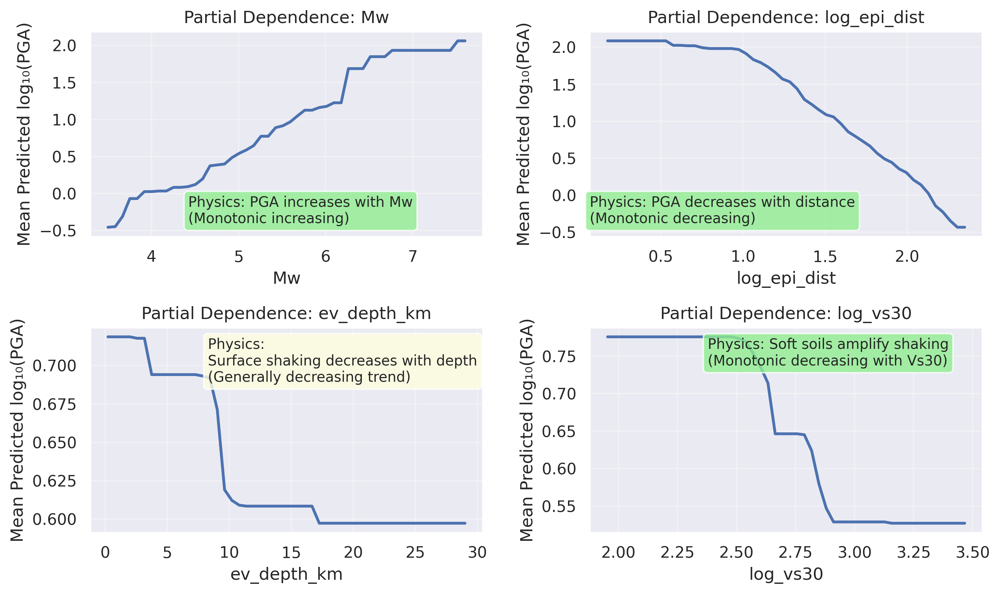


Partial Dependence Analysis using CatBoost (Monotonic):


In [ ]:
partial_dependence_path = FIGURES_PATH / 'model_diagnostics' / 'partial_dependence.png'

# Use best overall model for partial dependence visualization
# For PyTorch MLP, we need a wrapper function
best_pdp_model_key = min(all_results.keys(), key=lambda k: all_results[k]['overall_metrics']['rmse'])
best_pdp_model_name = all_results[best_pdp_model_key]['model_name']

if best_pdp_model_key == 'pytorch_mlp':
    # PyTorch MLP needs special handling
    print(f"Using {best_pdp_model_name} for Partial Dependence Plots")
    pdp_model = all_results['pytorch_mlp']['model']
    pdp_model.eval()
    
    def pdp_predict(X_data):
        """Wrapper for PyTorch model prediction."""
        # Use global scaler (fit on training data X)
        X_scaled_pdp = scaler.transform(X_data)
        X_tensor = torch.tensor(X_scaled_pdp, dtype=torch.float32).to(device)
        with torch.no_grad():
            return pdp_model(X_tensor).cpu().numpy().flatten()
else:
    # Scikit-learn compatible models
    print(f"Using {best_pdp_model_name} for Partial Dependence Plots")
    pdp_model = all_results[best_pdp_model_key]['model']
    pdp_predict = pdp_model.predict

def plot_partial_dependence(feature_name, feature_idx, ax, predict_fn, X_data, n_points=50):
    """Plot partial dependence of model on a single feature."""
    feature_values = np.linspace(X_data[feature_name].min(), X_data[feature_name].max(), n_points)
    
    pdp_values = []
    for val in feature_values:
        X_temp = X_data.copy()
        X_temp[feature_name] = val
        predictions = predict_fn(X_temp)
        pdp_values.append(predictions.mean())
    
    ax.plot(feature_values, pdp_values, 'b-', linewidth=2)
    ax.set_xlabel(feature_name)
    ax.set_ylabel('Mean Predicted log₁₀(PGA)')
    ax.set_title(f'Partial Dependence: {feature_name}')
    ax.grid(True, alpha=0.3)
    
    # Add physics interpretation
    return feature_values, pdp_values

# Always regenerate figures (models are cached, figures are not)
fig, axes = plt.subplots(2, 2, figsize=(10, 6))

# Mw partial dependence
fv, pdp = plot_partial_dependence('Mw', 0, axes[0, 0], pdp_predict, X)
axes[0, 0].annotate('Physics: PGA increases with Mw\n(Monotonic increasing)', 
                    xy=(0.25, 0.2), xycoords='axes fraction', fontsize=10,
                    verticalalignment='top', bbox=dict(boxstyle='round', facecolor='lightgreen', alpha=0.8))

# Distance partial dependence
fv, pdp = plot_partial_dependence('log_epi_dist', 2, axes[0, 1], pdp_predict, X)
axes[0, 1].annotate('Physics: PGA decreases with distance\n(Monotonic decreasing)', 
                    xy=(0.0, 0.2), xycoords='axes fraction', fontsize=10,
                    verticalalignment='top', bbox=dict(boxstyle='round', facecolor='lightgreen', alpha=0.8))

# Depth partial dependence  
fv, pdp = plot_partial_dependence('ev_depth_km', 1, axes[1, 0], pdp_predict, X)
axes[1, 0].annotate('Physics: \nSurface shaking decreases with depth\n(Generally decreasing trend)', 
                    xy=(0.3, 0.95), xycoords='axes fraction', fontsize=10,
                    verticalalignment='top', bbox=dict(boxstyle='round', facecolor='lightyellow', alpha=0.8))

# Vs30 partial dependence
fv, pdp = plot_partial_dependence('log_vs30', 3, axes[1, 1], pdp_predict, X)
axes[1, 1].annotate('Physics: Soft soils amplify shaking\n(Monotonic decreasing with Vs30)', 
                    xy=(0.3, 0.95), xycoords='axes fraction', fontsize=10,
                    verticalalignment='top', bbox=dict(boxstyle='round', facecolor='lightgreen', alpha=0.8))

plt.tight_layout()
plt.savefig(partial_dependence_path, dpi=150, bbox_inches='tight')
plt.show()

print(f"\nPartial Dependence Analysis using {best_pdp_model_name}:")

- Mw: Monotonic INCREASING (larger earthquake → stronger shaking)
- Distance: Monotonic DECREASING (farther → weaker shaking)
- Vs30: Generally DECREASING (harder rock → less amplification)
- Depth: Complex but generally decreasing trend

## 5.5 Residual Diagnostics

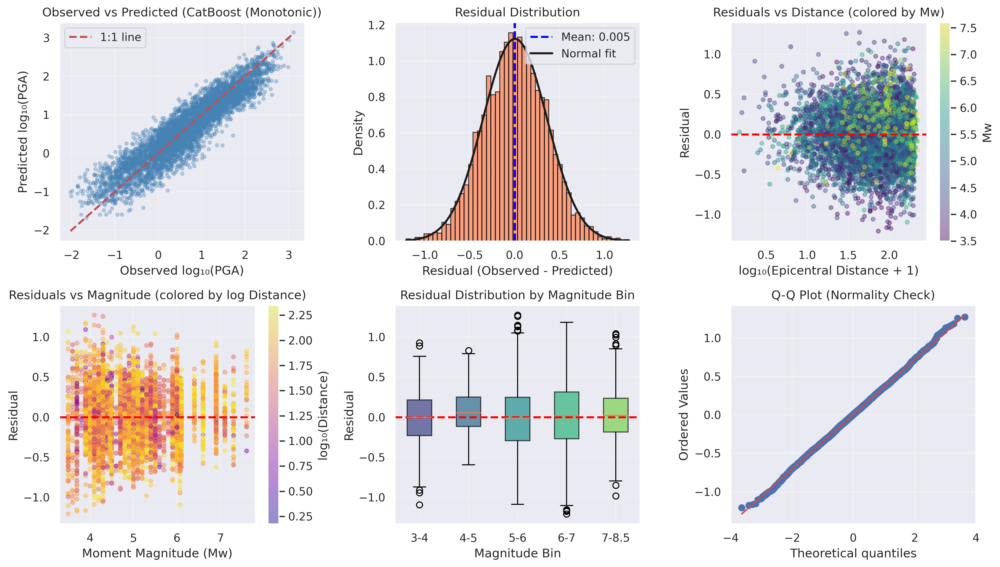


Residual Statistics:
   Mean: 0.0052 (should be ~0)
   Std:  0.3551
   Skewness: -0.000
   Kurtosis: 0.058

RESIDUAL DECOMPOSITION ANALYSIS
Following Al Atik et al. (2010) methodology

RESIDUAL DECOMPOSITION RESULTS:
Component                      Value      Percentage
------------------------------------------------------------
Between-Event (τ)              0.2283    41.32%
Site-to-Site (φ_S2S)           0.2605    53.80%
Within-Event (φ_0)             0.1795    25.56%
------------------------------------------------------------
Computed Total (√sum)          0.3901
Observed Total (std)           0.3551
Difference                     0.035002


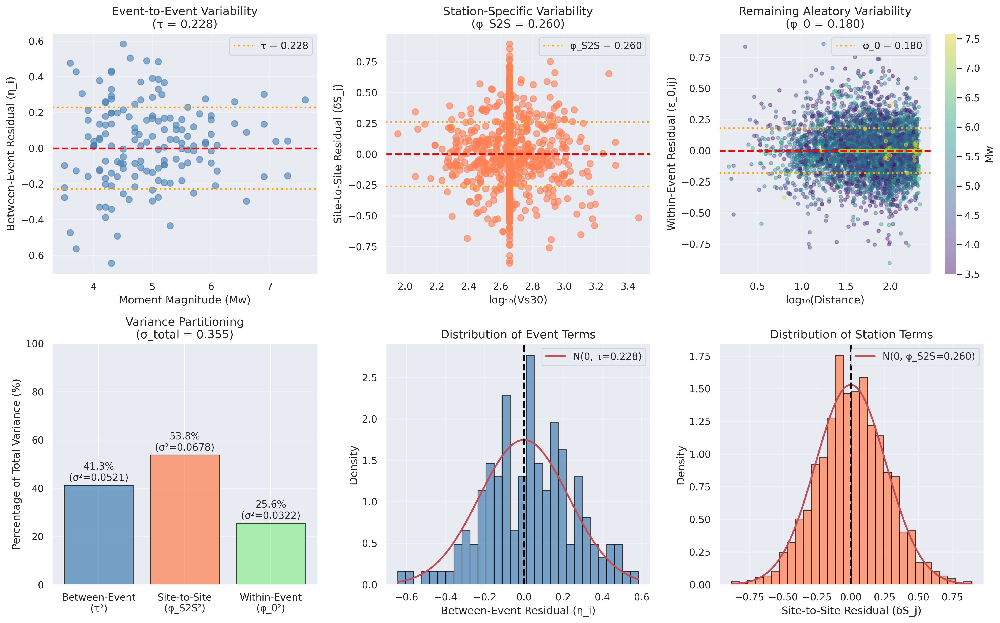


Residual decomposition figure saved to: /home/ghiffaryr/Physics-Constrained-Machine-Learning-for-Seismic-Risk-Assessment-in-Italy/figures/model_diagnostics/residual_decomposition.png

BIAS VERIFICATION:
Checking for systematic trends in residual components...
  η_i vs Mw correlation: r=0.066, p=0.4223
  δS_j vs log(Vs30) correlation: r=-0.017, p=0.5134
  ε_0,ij vs log(Distance) correlation: r=-0.038, p=0.0068

PASS! No significant systematic bias detected (|r| < 0.1)

END RESIDUAL DECOMPOSITION ANALYSIS


In [112]:
residual_diagnostics_path = FIGURES_PATH / 'model_diagnostics' / 'residual_diagnostics.png'

# Automatically select best model based on RMSE from comparison_df
best_model_key = min(all_results.keys(), key=lambda k: all_results[k]['overall_metrics']['rmse'])
best_model_display_name = all_results[best_model_key]['model_name']
best_predictions = all_results[best_model_key]['predictions']
residuals = y_pga.values - best_predictions

fig, axes = plt.subplots(2, 3, figsize=(14, 8))

# 1. Observed vs Predicted
ax1 = axes[0, 0]
ax1.scatter(y_pga, best_predictions, alpha=0.3, s=10, c='steelblue')
ax1.plot([y_pga.min(), y_pga.max()], [y_pga.min(), y_pga.max()], 'r--', linewidth=2, label='1:1 line')
ax1.set_xlabel('Observed log₁₀(PGA)')
ax1.set_ylabel('Predicted log₁₀(PGA)')
ax1.set_title(f'Observed vs Predicted ({best_model_display_name})')
ax1.legend()
ax1.grid(True, alpha=0.3)

# 2. Residuals histogram
ax2 = axes[0, 1]
ax2.hist(residuals, bins=50, color='coral', edgecolor='black', alpha=0.7, density=True)
ax2.axvline(0, color='red', linestyle='--', linewidth=2)
ax2.axvline(residuals.mean(), color='blue', linestyle='--', linewidth=2, label=f'Mean: {residuals.mean():.3f}')
# Fit normal distribution
from scipy.stats import norm, pearsonr
x = np.linspace(residuals.min(), residuals.max(), 100)
ax2.plot(x, norm.pdf(x, residuals.mean(), residuals.std()), 'k-', linewidth=2, label='Normal fit')
ax2.set_xlabel('Residual (Observed - Predicted)')
ax2.set_ylabel('Density')
ax2.set_title('Residual Distribution')
ax2.legend()
ax2.grid(True, alpha=0.3)

# 3. Residuals vs Distance
ax3 = axes[0, 2]
scatter = ax3.scatter(df_model['log_epi_dist'], residuals, c=df_model['Mw'], 
                       cmap='viridis', alpha=0.4, s=15)
ax3.axhline(0, color='red', linestyle='--', linewidth=2)
ax3.set_xlabel('log₁₀(Epicentral Distance + 1)')
ax3.set_ylabel('Residual')
ax3.set_title('Residuals vs Distance (colored by Mw)')
plt.colorbar(scatter, ax=ax3, label='Mw')
ax3.grid(True, alpha=0.3)

# 4. Residuals vs Magnitude
ax4 = axes[1, 0]
scatter = ax4.scatter(df_model['Mw'], residuals, c=df_model['log_epi_dist'], 
                       cmap='plasma', alpha=0.4, s=15)
ax4.axhline(0, color='red', linestyle='--', linewidth=2)
ax4.set_xlabel('Moment Magnitude (Mw)')
ax4.set_ylabel('Residual')
ax4.set_title('Residuals vs Magnitude (colored by log Distance)')
plt.colorbar(scatter, ax=ax4, label='log₁₀(Distance)')
ax4.grid(True, alpha=0.3)

# 5. Residuals by Mw bins
ax5 = axes[1, 1]
mw_bins = pd.cut(df_model['Mw'], bins=[3, 4, 5, 6, 7, 8.5], labels=['3-4', '4-5', '5-6', '6-7', '7-8.5'])
residuals_by_mw = [residuals[mw_bins == bin_label] for bin_label in mw_bins.unique().dropna()]
bp = ax5.boxplot(residuals_by_mw, labels=[str(x) for x in sorted(mw_bins.unique().dropna())], patch_artist=True)
for patch, color in zip(bp['boxes'], plt.cm.viridis(np.linspace(0.2, 0.8, len(residuals_by_mw)))):
    patch.set_facecolor(color)
    patch.set_alpha(0.7)
ax5.axhline(0, color='red', linestyle='--', linewidth=2)
ax5.set_xlabel('Magnitude Bin')
ax5.set_ylabel('Residual')
ax5.set_title('Residual Distribution by Magnitude Bin')
ax5.grid(True, alpha=0.3)

# 6. Q-Q plot
ax6 = axes[1, 2]
from scipy import stats
stats.probplot(residuals, dist="norm", plot=ax6)
ax6.set_title('Q-Q Plot (Normality Check)')
ax6.grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig(residual_diagnostics_path, dpi=150, bbox_inches='tight')
plt.show()

print(f"\nResidual Statistics:")
print(f"   Mean: {residuals.mean():.4f} (should be ~0)")
print(f"   Std:  {residuals.std():.4f}")
print(f"   Skewness: {stats.skew(residuals):.3f}")
print(f"   Kurtosis: {stats.kurtosis(residuals):.3f}")

# ===================================================
# RESIDUAL DECOMPOSITION (Al Atik et al. 2010)
# Following Lucia et al. methodology
# ===================================================

print("\n" + "="*60)
print("RESIDUAL DECOMPOSITION ANALYSIS")
print("Following Al Atik et al. (2010) methodology")
print("="*60)

# Residual decomposition: ε_ij = η_i + δS_j + ε_0,ij
# Add residuals to df_model temporarily
df_residuals = df_model.copy()
df_residuals['residual'] = residuals

# Add station_id column from original data if not present
if 'station_id' not in df_residuals.columns and 'station_code' in df.columns:
    # Match station_code from original df using index
    df_residuals['station_id'] = df_residuals.index.map(lambda idx: df.loc[idx, 'station_code'] if idx in df.index else None)
    
# If still no station_id, create a numeric one from the index
if 'station_id' not in df_residuals.columns:
    print("WARNING! No station information available, creating dummy station IDs")
    df_residuals['station_id'] = np.arange(len(df_residuals))

# 1. Between-Event Residuals (η_i)
event_means = df_residuals.groupby('event_id')['residual'].mean()
df_residuals['eta_i'] = df_residuals['event_id'].map(event_means)
tau = event_means.std()

# 2. Site-to-Site Residuals (δS_j)
df_residuals['residual_minus_event'] = df_residuals['residual'] - df_residuals['eta_i']
station_means = df_residuals.groupby('station_id')['residual_minus_event'].mean()
df_residuals['delta_Sj'] = df_residuals['station_id'].map(station_means)
phi_S2S = station_means.std()

# 3. Within-Event Residuals (ε_0,ij)
df_residuals['epsilon_0ij'] = df_residuals['residual'] - df_residuals['eta_i'] - df_residuals['delta_Sj']
phi_0 = df_residuals['epsilon_0ij'].std()

# 4. Verify Total Sigma
sigma_total_computed = np.sqrt(tau**2 + phi_S2S**2 + phi_0**2)
sigma_total_observed = residuals.std()

print(f"\nRESIDUAL DECOMPOSITION RESULTS:")
print(f"{'Component':<30} {'Value':<10} {'Percentage'}")
print("-" * 60)
print(f"{'Between-Event (τ)':<30} {tau:.4f}    {(tau**2/sigma_total_observed**2*100):.2f}%")
print(f"{'Site-to-Site (φ_S2S)':<30} {phi_S2S:.4f}    {(phi_S2S**2/sigma_total_observed**2*100):.2f}%")
print(f"{'Within-Event (φ_0)':<30} {phi_0:.4f}    {(phi_0**2/sigma_total_observed**2*100):.2f}%")
print("-" * 60)
print(f"{'Computed Total (√sum)':<30} {sigma_total_computed:.4f}")
print(f"{'Observed Total (std)':<30} {sigma_total_observed:.4f}")
print(f"{'Difference':<30} {abs(sigma_total_computed - sigma_total_observed):.6f}")

# 5. Visualization: Residual Decomposition
decomp_path = FIGURES_PATH / 'model_diagnostics' / 'residual_decomposition.png'

fig, axes = plt.subplots(2, 3, figsize=(16, 10))

# 5.1: Between-Event Residuals vs Mw
ax1 = axes[0, 0]
event_data = df_residuals.groupby('event_id').agg({'Mw': 'first', 'eta_i': 'first'})
ax1.scatter(event_data['Mw'], event_data['eta_i'], alpha=0.6, s=50, c='steelblue')
ax1.axhline(0, color='red', linestyle='--', linewidth=2)
ax1.axhline(tau, color='orange', linestyle=':', linewidth=2, label=f'τ = {tau:.3f}')
ax1.axhline(-tau, color='orange', linestyle=':', linewidth=2)
ax1.set_xlabel('Moment Magnitude (Mw)', fontsize=12)
ax1.set_ylabel('Between-Event Residual (η_i)', fontsize=12)
ax1.set_title('Event-to-Event Variability\n(τ = {:.3f})'.format(tau), fontsize=13)
ax1.legend(fontsize=11)
ax1.grid(True, alpha=0.3)

# 5.2: Site-to-Site Residuals vs Vs30
ax2 = axes[0, 1]
station_data = df_residuals.groupby('station_id').agg({'log_vs30': 'first', 'delta_Sj': 'first'})
ax2.scatter(station_data['log_vs30'], station_data['delta_Sj'], alpha=0.6, s=50, c='coral')
ax2.axhline(0, color='red', linestyle='--', linewidth=2)
ax2.axhline(phi_S2S, color='orange', linestyle=':', linewidth=2, label=f'φ_S2S = {phi_S2S:.3f}')
ax2.axhline(-phi_S2S, color='orange', linestyle=':', linewidth=2)
ax2.set_xlabel('log₁₀(Vs30)', fontsize=12)
ax2.set_ylabel('Site-to-Site Residual (δS_j)', fontsize=12)
ax2.set_title('Station-Specific Variability\n(φ_S2S = {:.3f})'.format(phi_S2S), fontsize=13)
ax2.legend(fontsize=11)
ax2.grid(True, alpha=0.3)

# 5.3: Within-Event Residuals vs Distance
ax3 = axes[0, 2]
scatter = ax3.scatter(df_residuals['log_epi_dist'], df_residuals['epsilon_0ij'], 
                      c=df_residuals['Mw'], cmap='viridis', alpha=0.4, s=15)
ax3.axhline(0, color='red', linestyle='--', linewidth=2)
ax3.axhline(phi_0, color='orange', linestyle=':', linewidth=2, label=f'φ_0 = {phi_0:.3f}')
ax3.axhline(-phi_0, color='orange', linestyle=':', linewidth=2)
plt.colorbar(scatter, ax=ax3, label='Mw')
ax3.set_xlabel('log₁₀(Distance)', fontsize=12)
ax3.set_ylabel('Within-Event Residual (ε_0,ij)', fontsize=12)
ax3.set_title('Remaining Aleatory Variability\n(φ_0 = {:.3f})'.format(phi_0), fontsize=13)
ax3.legend(fontsize=11)
ax3.grid(True, alpha=0.3)

# 5.4: Variance Partitioning
ax4 = axes[1, 0]
components = ['Between-Event\n(τ²)', 'Site-to-Site\n(φ_S2S²)', 'Within-Event\n(φ_0²)']
variances = [tau**2, phi_S2S**2, phi_0**2]
percentages = [v/sigma_total_observed**2*100 for v in variances]
colors = ['steelblue', 'coral', 'lightgreen']
bars = ax4.bar(components, percentages, color=colors, edgecolor='black', alpha=0.7)
for bar, pct, var in zip(bars, percentages, variances):
    height = bar.get_height()
    ax4.text(bar.get_x() + bar.get_width()/2., height + 1,
            f'{pct:.1f}%\n(σ²={var:.4f})',
            ha='center', va='bottom', fontsize=11)
ax4.set_ylabel('Percentage of Total Variance (%)', fontsize=12)
ax4.set_title(f'Variance Partitioning\n(σ_total = {sigma_total_observed:.3f})', fontsize=13)
ax4.set_ylim(0, 100)
ax4.grid(True, alpha=0.3, axis='y')

# 5.5: Histogram of Between-Event Residuals
ax5 = axes[1, 1]
ax5.hist(event_data['eta_i'], bins=30, color='steelblue', edgecolor='black', alpha=0.7, density=True)
x = np.linspace(event_data['eta_i'].min(), event_data['eta_i'].max(), 100)
ax5.plot(x, norm.pdf(x, 0, tau), 'r-', linewidth=2, label=f'N(0, τ={tau:.3f})')
ax5.axvline(0, color='black', linestyle='--', linewidth=2)
ax5.set_xlabel('Between-Event Residual (η_i)', fontsize=12)
ax5.set_ylabel('Density', fontsize=12)
ax5.set_title('Distribution of Event Terms', fontsize=13)
ax5.legend(fontsize=11)
ax5.grid(True, alpha=0.3)

# 5.6: Histogram of Site-to-Site Residuals
ax6 = axes[1, 2]
ax6.hist(station_data['delta_Sj'], bins=30, color='coral', edgecolor='black', alpha=0.7, density=True)
x = np.linspace(station_data['delta_Sj'].min(), station_data['delta_Sj'].max(), 100)
ax6.plot(x, norm.pdf(x, 0, phi_S2S), 'r-', linewidth=2, label=f'N(0, φ_S2S={phi_S2S:.3f})')
ax6.axvline(0, color='black', linestyle='--', linewidth=2)
ax6.set_xlabel('Site-to-Site Residual (δS_j)', fontsize=12)
ax6.set_ylabel('Density', fontsize=12)
ax6.set_title('Distribution of Station Terms', fontsize=13)
ax6.legend(fontsize=11)
ax6.grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig(decomp_path, dpi=300, bbox_inches='tight')
plt.show()
print(f"\nResidual decomposition figure saved to: {decomp_path}")

# 6. Bias Verification
print("\nBIAS VERIFICATION:")
print("Checking for systematic trends in residual components...")

# Between-event vs Mw
r_event_mw, p_event_mw = pearsonr(event_data['Mw'], event_data['eta_i'])
print(f"  η_i vs Mw correlation: r={r_event_mw:.3f}, p={p_event_mw:.4f}")

# Site-to-site vs Vs30
r_site_vs30, p_site_vs30 = pearsonr(station_data['log_vs30'], station_data['delta_Sj'])
print(f"  δS_j vs log(Vs30) correlation: r={r_site_vs30:.3f}, p={p_site_vs30:.4f}")

# Within-event vs Distance
r_within_dist, p_within_dist = pearsonr(df_residuals['log_epi_dist'], df_residuals['epsilon_0ij'])
print(f"  ε_0,ij vs log(Distance) correlation: r={r_within_dist:.3f}, p={p_within_dist:.4f}")

if abs(r_event_mw) < 0.1 and abs(r_site_vs30) < 0.1 and abs(r_within_dist) < 0.1:
    print("\nPASS! No significant systematic bias detected (|r| < 0.1)")
else:
    print("\nWARNING! Some systematic trends detected - review plots")

print("\n" + "="*60)
print("END RESIDUAL DECOMPOSITION ANALYSIS")
print("="*60)

## 5.6 GPR-Specific Residual Analysis

GPR MODEL: Residual Diagnostics and Decomposition Analysis

Model: GPR (Event-based CV)
RMSE: 0.5801

GPR Residual Statistics:
   Mean: -0.0552 (should be ~0)
   Std:  0.5775
   Skewness: -0.161
   Kurtosis: 0.034

GPR RESIDUAL DECOMPOSITION ANALYSIS
Following Al Atik et al. (2010) methodology

GPR RESIDUAL DECOMPOSITION RESULTS:
Component                      Value      Percentage
------------------------------------------------------------
Between-Event (τ)              0.4713    66.60%
Site-to-Site (φ_S2S)           0.2836    24.12%
Within-Event (φ_0)             0.2285    15.65%
------------------------------------------------------------
Computed Total (√sum)          0.5956
Observed Total (std)           0.5775
Difference                     0.018116


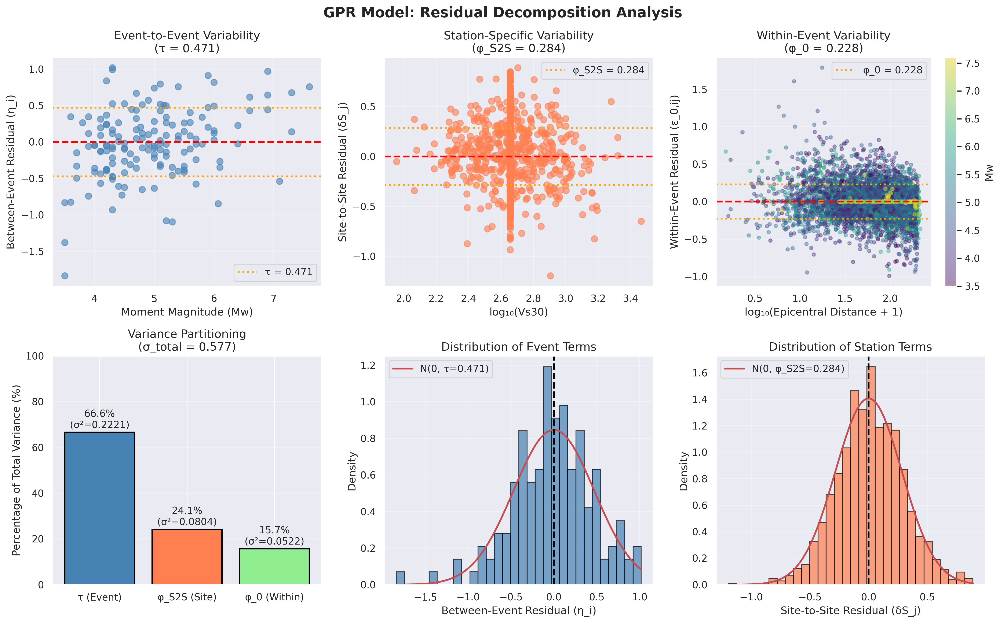


GPR residual decomposition figure saved to: /home/ghiffaryr/Physics-Constrained-Machine-Learning-for-Seismic-Risk-Assessment-in-Italy/figures/model_diagnostics/gpr_residual_decomposition.png

GPR BIAS VERIFICATION:
Checking for systematic trends in residual components...
  η_i vs Mw correlation: r=0.324, p=0.0001
  δS_j vs log(Vs30) correlation: r=-0.072, p=0.0050
  ε_0,ij vs log(Distance) correlation: r=-0.155, p=0.0000

WARNING! Some systematic trends detected - review plots

END GPR RESIDUAL DECOMPOSITION ANALYSIS


In [113]:
"""
Dedicated Residual Analysis for GPR Model
Includes residual decomposition following Al Atik et al. (2010) methodology
"""
print("="*70)
print("GPR MODEL: Residual Diagnostics and Decomposition Analysis")
print("="*70)

# Get GPR model results
if 'gpr' in all_results:
    gpr_model_name = all_results['gpr']['model_name']
    gpr_predictions = all_results['gpr']['predictions']
    gpr_residuals = y_pga.values - gpr_predictions
    gpr_rmse = all_results['gpr']['overall_metrics']['rmse']
    
    print(f"\nModel: {gpr_model_name}")
    print(f"RMSE: {gpr_rmse:.4f}")
    print(f"\nGPR Residual Statistics:")
    print(f"   Mean: {gpr_residuals.mean():.4f} (should be ~0)")
    print(f"   Std:  {gpr_residuals.std():.4f}")
    print(f"   Skewness: {stats.skew(gpr_residuals):.3f}")
    print(f"   Kurtosis: {stats.kurtosis(gpr_residuals):.3f}")
    
    # ===================================================
    # RESIDUAL DECOMPOSITION FOR GPR
    # ===================================================
    
    print("\n" + "="*60)
    print("GPR RESIDUAL DECOMPOSITION ANALYSIS")
    print("Following Al Atik et al. (2010) methodology")
    print("="*60)
    
    # Create residuals dataframe
    df_gpr_residuals = df_model.copy()
    df_gpr_residuals['residual'] = gpr_residuals
    
    # Add station_id if not present
    if 'station_id' not in df_gpr_residuals.columns and 'station_code' in df.columns:
        df_gpr_residuals['station_id'] = df_gpr_residuals.index.map(
            lambda idx: df.loc[idx, 'station_code'] if idx in df.index else None
        )
    
    if 'station_id' not in df_gpr_residuals.columns:
        print("WARNING! No station information available, creating dummy station IDs")
        df_gpr_residuals['station_id'] = np.arange(len(df_gpr_residuals))
    
    # 1. Between-Event Residuals (η_i)
    gpr_event_means = df_gpr_residuals.groupby('event_id')['residual'].mean()
    df_gpr_residuals['eta_i'] = df_gpr_residuals['event_id'].map(gpr_event_means)
    gpr_tau = gpr_event_means.std()
    
    # 2. Site-to-Site Residuals (δS_j)
    df_gpr_residuals['residual_minus_event'] = df_gpr_residuals['residual'] - df_gpr_residuals['eta_i']
    gpr_station_means = df_gpr_residuals.groupby('station_id')['residual_minus_event'].mean()
    df_gpr_residuals['delta_Sj'] = df_gpr_residuals['station_id'].map(gpr_station_means)
    gpr_phi_S2S = gpr_station_means.std()
    
    # 3. Within-Event Residuals (ε_0,ij)
    df_gpr_residuals['epsilon_0ij'] = (df_gpr_residuals['residual'] - 
                                         df_gpr_residuals['eta_i'] - 
                                         df_gpr_residuals['delta_Sj'])
    gpr_phi_0 = df_gpr_residuals['epsilon_0ij'].std()
    
    # 4. Verify Total Sigma
    gpr_sigma_total_computed = np.sqrt(gpr_tau**2 + gpr_phi_S2S**2 + gpr_phi_0**2)
    gpr_sigma_total_observed = gpr_residuals.std()
    
    print(f"\nGPR RESIDUAL DECOMPOSITION RESULTS:")
    print(f"{'Component':<30} {'Value':<10} {'Percentage'}")
    print("-" * 60)
    print(f"{'Between-Event (τ)':<30} {gpr_tau:.4f}    {(gpr_tau**2/gpr_sigma_total_observed**2*100):.2f}%")
    print(f"{'Site-to-Site (φ_S2S)':<30} {gpr_phi_S2S:.4f}    {(gpr_phi_S2S**2/gpr_sigma_total_observed**2*100):.2f}%")
    print(f"{'Within-Event (φ_0)':<30} {gpr_phi_0:.4f}    {(gpr_phi_0**2/gpr_sigma_total_observed**2*100):.2f}%")
    print("-" * 60)
    print(f"{'Computed Total (√sum)':<30} {gpr_sigma_total_computed:.4f}")
    print(f"{'Observed Total (std)':<30} {gpr_sigma_total_observed:.4f}")
    print(f"{'Difference':<30} {abs(gpr_sigma_total_computed - gpr_sigma_total_observed):.6f}")
    
    # 5. Visualization
    gpr_decomp_path = FIGURES_PATH / 'model_diagnostics' / 'gpr_residual_decomposition.png'
    
    fig, axes = plt.subplots(2, 3, figsize=(16, 10))
    fig.suptitle(f'GPR Model: Residual Decomposition Analysis', fontsize=16, fontweight='bold')
    
    # 5.1: Between-Event Residuals vs Mw
    ax1 = axes[0, 0]
    gpr_event_data = df_gpr_residuals.groupby('event_id').agg({'Mw': 'first', 'eta_i': 'first'})
    ax1.scatter(gpr_event_data['Mw'], gpr_event_data['eta_i'], alpha=0.6, s=50, c='steelblue')
    ax1.axhline(0, color='red', linestyle='--', linewidth=2)
    ax1.axhline(gpr_tau, color='orange', linestyle=':', linewidth=2, label=f'τ = {gpr_tau:.3f}')
    ax1.axhline(-gpr_tau, color='orange', linestyle=':', linewidth=2)
    ax1.set_xlabel('Moment Magnitude (Mw)', fontsize=12)
    ax1.set_ylabel('Between-Event Residual (η_i)', fontsize=12)
    ax1.set_title('Event-to-Event Variability\n(τ = {:.3f})'.format(gpr_tau), fontsize=13)
    ax1.legend(fontsize=11)
    ax1.grid(True, alpha=0.3)
    
    # 5.2: Site-to-Site Residuals vs Vs30
    ax2 = axes[0, 1]
    gpr_station_data = df_gpr_residuals.groupby('station_id').agg({'log_vs30': 'first', 'delta_Sj': 'first'})
    ax2.scatter(gpr_station_data['log_vs30'], gpr_station_data['delta_Sj'], alpha=0.6, s=50, c='coral')
    ax2.axhline(0, color='red', linestyle='--', linewidth=2)
    ax2.axhline(gpr_phi_S2S, color='orange', linestyle=':', linewidth=2, label=f'φ_S2S = {gpr_phi_S2S:.3f}')
    ax2.axhline(-gpr_phi_S2S, color='orange', linestyle=':', linewidth=2)
    ax2.set_xlabel('log₁₀(Vs30)', fontsize=12)
    ax2.set_ylabel('Site-to-Site Residual (δS_j)', fontsize=12)
    ax2.set_title('Station-Specific Variability\n(φ_S2S = {:.3f})'.format(gpr_phi_S2S), fontsize=13)
    ax2.legend(fontsize=11)
    ax2.grid(True, alpha=0.3)
    
    # 5.3: Within-Event Residuals vs Distance
    ax3 = axes[0, 2]
    scatter = ax3.scatter(df_gpr_residuals['log_epi_dist'], df_gpr_residuals['epsilon_0ij'], 
                          c=df_gpr_residuals['Mw'], cmap='viridis', alpha=0.4, s=15)
    ax3.axhline(0, color='red', linestyle='--', linewidth=2)
    ax3.axhline(gpr_phi_0, color='orange', linestyle=':', linewidth=2, label=f'φ_0 = {gpr_phi_0:.3f}')
    ax3.axhline(-gpr_phi_0, color='orange', linestyle=':', linewidth=2)
    ax3.set_xlabel('log₁₀(Epicentral Distance + 1)', fontsize=12)
    ax3.set_ylabel('Within-Event Residual (ε_0,ij)', fontsize=12)
    ax3.set_title('Within-Event Variability\n(φ_0 = {:.3f})'.format(gpr_phi_0), fontsize=13)
    plt.colorbar(scatter, ax=ax3, label='Mw')
    ax3.legend(fontsize=11)
    ax3.grid(True, alpha=0.3)
    
    # 5.4: Variance Partitioning Bar Chart
    ax4 = axes[1, 0]
    components = ['τ (Event)', 'φ_S2S (Site)', 'φ_0 (Within)']
    variances = [gpr_tau**2, gpr_phi_S2S**2, gpr_phi_0**2]
    percentages = [v/gpr_sigma_total_observed**2 * 100 for v in variances]
    colors_gpr = ['steelblue', 'coral', 'lightgreen']
    
    bars = ax4.bar(components, percentages, color=colors_gpr, edgecolor='black', linewidth=1.5)
    for bar, pct, var in zip(bars, percentages, variances):
        height = bar.get_height()
        ax4.text(bar.get_x() + bar.get_width()/2., height + 1,
                f'{pct:.1f}%\n(σ²={var:.4f})',
                ha='center', va='bottom', fontsize=11)
    ax4.set_ylabel('Percentage of Total Variance (%)', fontsize=12)
    ax4.set_title(f'Variance Partitioning\n(σ_total = {gpr_sigma_total_observed:.3f})', fontsize=13)
    ax4.set_ylim(0, 100)
    ax4.grid(True, alpha=0.3, axis='y')
    
    # 5.5: Histogram of Between-Event Residuals
    ax5 = axes[1, 1]
    ax5.hist(gpr_event_data['eta_i'], bins=30, color='steelblue', edgecolor='black', alpha=0.7, density=True)
    x = np.linspace(gpr_event_data['eta_i'].min(), gpr_event_data['eta_i'].max(), 100)
    ax5.plot(x, norm.pdf(x, 0, gpr_tau), 'r-', linewidth=2, label=f'N(0, τ={gpr_tau:.3f})')
    ax5.axvline(0, color='black', linestyle='--', linewidth=2)
    ax5.set_xlabel('Between-Event Residual (η_i)', fontsize=12)
    ax5.set_ylabel('Density', fontsize=12)
    ax5.set_title('Distribution of Event Terms', fontsize=13)
    ax5.legend(fontsize=11)
    ax5.grid(True, alpha=0.3)
    
    # 5.6: Histogram of Site-to-Site Residuals
    ax6 = axes[1, 2]
    ax6.hist(gpr_station_data['delta_Sj'], bins=30, color='coral', edgecolor='black', alpha=0.7, density=True)
    x = np.linspace(gpr_station_data['delta_Sj'].min(), gpr_station_data['delta_Sj'].max(), 100)
    ax6.plot(x, norm.pdf(x, 0, gpr_phi_S2S), 'r-', linewidth=2, label=f'N(0, φ_S2S={gpr_phi_S2S:.3f})')
    ax6.axvline(0, color='black', linestyle='--', linewidth=2)
    ax6.set_xlabel('Site-to-Site Residual (δS_j)', fontsize=12)
    ax6.set_ylabel('Density', fontsize=12)
    ax6.set_title('Distribution of Station Terms', fontsize=13)
    ax6.legend(fontsize=11)
    ax6.grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.savefig(gpr_decomp_path, dpi=300, bbox_inches='tight')
    plt.show()
    print(f"\nGPR residual decomposition figure saved to: {gpr_decomp_path}")
    
    # 6. Bias Verification
    print("\nGPR BIAS VERIFICATION:")
    print("Checking for systematic trends in residual components...")
    
    # Between-event vs Mw
    r_event_mw, p_event_mw = pearsonr(gpr_event_data['Mw'], gpr_event_data['eta_i'])
    print(f"  η_i vs Mw correlation: r={r_event_mw:.3f}, p={p_event_mw:.4f}")
    
    # Site-to-site vs Vs30
    r_site_vs30, p_site_vs30 = pearsonr(gpr_station_data['log_vs30'], gpr_station_data['delta_Sj'])
    print(f"  δS_j vs log(Vs30) correlation: r={r_site_vs30:.3f}, p={p_site_vs30:.4f}")
    
    # Within-event vs Distance
    r_within_dist, p_within_dist = pearsonr(df_gpr_residuals['log_epi_dist'], df_gpr_residuals['epsilon_0ij'])
    print(f"  ε_0,ij vs log(Distance) correlation: r={r_within_dist:.3f}, p={p_within_dist:.4f}")
    
    if abs(r_event_mw) < 0.1 and abs(r_site_vs30) < 0.1 and abs(r_within_dist) < 0.1:
        print("\nPASS! No significant systematic bias detected (|r| < 0.1)")
    else:
        print("\nWARNING! Some systematic trends detected - review plots")
    
    print("\n" + "="*70)
    print("END GPR RESIDUAL DECOMPOSITION ANALYSIS")
    print("="*70)
    
else:
    print("ERROR! GPR model not found in all_results")
    print("Available models:", list(all_results.keys()))

## 5.7 SHAP Feature Importance

Using CatBoost (Monotonic) for SHAP analysis (model type: tree)
Computing SHAP values for CatBoost (Monotonic)...


2026-02-18 17:05:26.495352: I tensorflow/core/util/port.cc:113] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2026-02-18 17:05:26.724311: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2026-02-18 17:05:26.724392: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2026-02-18 17:05:26.767220: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2026-02-18 17:05:26.849506: I tensorflow/core/platform/cpu_feature_guar

SHAP values computed and saved

SHAP Feature Importance Plot:


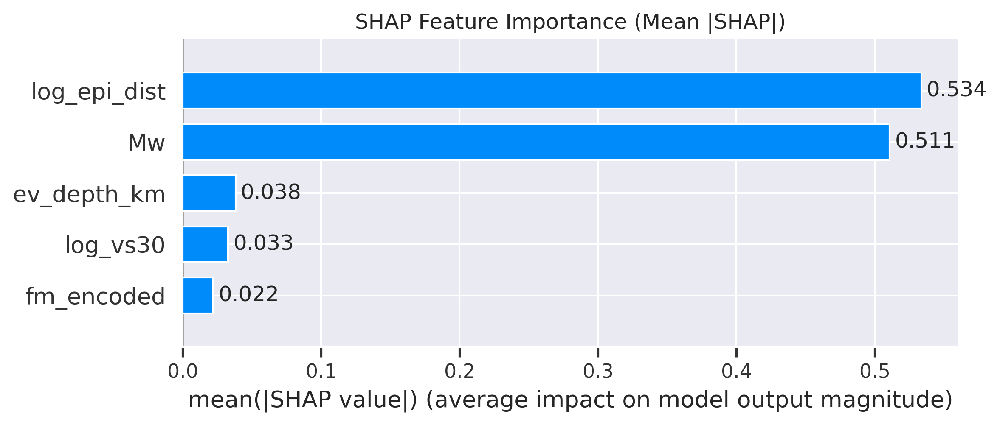


SHAP Summary Plot:


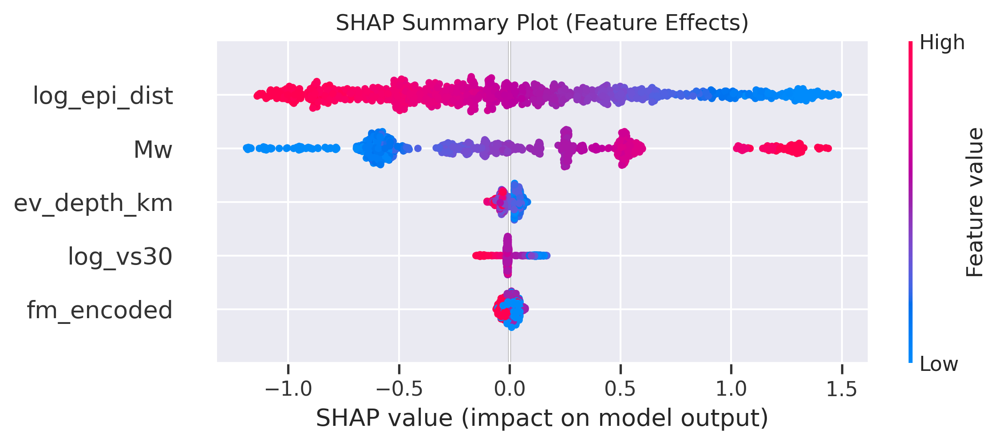


SHAP Feature Importance:
     Feature  Mean |SHAP|
log_epi_dist     0.533556
          Mw     0.510692
 ev_depth_km     0.038056
    log_vs30     0.032779
  fm_encoded     0.021950


In [114]:
shap_importance_path = FIGURES_PATH / 'model_diagnostics' / 'shap_importance.png'
shap_summary_path = FIGURES_PATH / 'model_diagnostics' / 'shap_summary.png'
shap_values_path = MODELS_PATH / 'shap_values.pkl'

tree_model_keys = ['catboost', 'xgb', 'lgbm', 'gbdt', 'rf']
linear_model_keys = ['ridge']
dl_model_keys = ['pytorch_mlp']

best_shap_model_key = min(all_results.keys(), key=lambda k: all_results[k]['overall_metrics']['rmse'])
best_shap_model_name = all_results[best_shap_model_key]['model_name']

if best_shap_model_key in tree_model_keys:
    model_type = 'tree'
    shap_model = all_results[best_shap_model_key]['model']
elif best_shap_model_key in linear_model_keys:
    model_type = 'linear'
    shap_model = all_results[best_shap_model_key]['model']
elif best_shap_model_key in dl_model_keys:
    model_type = 'deep_learning'
    # For DL, fall back to best tree model for SHAP (KernelExplainer is too slow)
    best_tree_model_key = min(
        [k for k in tree_model_keys if k in all_results],
        key=lambda k: all_results[k]['overall_metrics']['rmse']
    )
    shap_model = all_results[best_tree_model_key]['model']
    best_shap_model_name = all_results[best_tree_model_key]['model_name']
    print(f"Best model is PyTorch MLP - using {best_shap_model_name} for SHAP (TreeExplainer is faster)")
    model_type = 'tree'  # Use tree explainer for the fallback model
else:
    model_type = 'tree'
    shap_model = all_results[best_shap_model_key]['model']

print(f"Using {best_shap_model_name} for SHAP analysis (model type: {model_type})")

# Store best tree model for partial dependence plots
best_tree_model_key = min(
    [k for k in tree_model_keys if k in all_results],
    key=lambda k: all_results[k]['overall_metrics']['rmse']
)
best_tree_model = all_results[best_tree_model_key]['model']
best_tree_model_name = all_results[best_tree_model_key]['model_name']

if shap_values_path.exists():
    print("Loading existing SHAP values...")
    shap_data = joblib.load(shap_values_path)
    shap_values = shap_data['shap_values']
    X_sample = shap_data['X_sample']
    shap_importance = shap_data['shap_importance']
else:
    print(f"Computing SHAP values for {best_shap_model_name}...")
    
    # Sample data for efficiency
    X_sample = X.sample(min(1000, len(X)), random_state=RANDOM_STATE)
    
    # Create appropriate SHAP explainer based on model type
    if model_type == 'tree':
        explainer = shap.TreeExplainer(shap_model)
        shap_values = explainer.shap_values(X_sample)
    elif model_type == 'linear':
        # For Ridge/Linear models, use LinearExplainer
        explainer = shap.LinearExplainer(shap_model, X_sample)
        shap_values = explainer.shap_values(X_sample)
    else:
        # Fallback: use KernelExplainer (slow but universal)
        print("[NOTE]  Using KernelExplainer (this may take a while)...")
        X_background = shap.sample(X, min(100, len(X)))
        explainer = shap.KernelExplainer(shap_model.predict, X_background)
        shap_values = explainer.shap_values(X_sample)
    
    # Feature importance from SHAP
    shap_importance = pd.DataFrame({
        'Feature': FEATURE_COLS,
        'Mean |SHAP|': np.abs(shap_values).mean(axis=0)
    }).sort_values('Mean |SHAP|', ascending=False)
    
    # Save SHAP data
    joblib.dump({
        'shap_values': shap_values,
        'X_sample': X_sample,
        'shap_importance': shap_importance
    }, shap_values_path)
    print("SHAP values computed and saved")

# Always regenerate figures (models/data are cached, figures are not)
print("\nSHAP Feature Importance Plot:")
fig, ax = plt.subplots(figsize=(10, 5))
shap.summary_plot(shap_values, X_sample, plot_type="bar", show=False)

# Add value annotations on right edge of each bar
ax = plt.gca()
for container in ax.containers:
    ax.bar_label(container, fmt='%.3f', padding=3)

plt.title('SHAP Feature Importance (Mean |SHAP|)')
plt.tight_layout()
plt.savefig(shap_importance_path, dpi=300, bbox_inches='tight')
plt.show()

print("\nSHAP Summary Plot:")
plt.figure(figsize=(10, 5))
shap.summary_plot(shap_values, X_sample, show=False)
plt.title('SHAP Summary Plot (Feature Effects)')
plt.tight_layout()
plt.savefig(shap_summary_path, dpi=300, bbox_inches='tight')
plt.show()

print("\nSHAP Feature Importance:")
print(shap_importance.to_string(index=False))

In [115]:
shap_importance['Percentage'] = shap_importance['Mean |SHAP|'] / shap_importance['Mean |SHAP|'].sum() * 100
shap_importance

,Feature,Mean |SHAP|,Percentage
2,log_epi_dist,0.533556,46.925291
0,Mw,0.510692,44.914479
1,ev_depth_km,0.038056,3.346979
3,log_vs30,0.032779,2.882828
4,fm_encoded,0.021950,1.930423


In [116]:
print("\nCumulative importance of features with Mean |SHAP| > 0.5:",
f'{sum(shap_importance[shap_importance["Mean |SHAP|"] > 0.5]["Percentage"]):.1f}%')


Cumulative importance of features with Mean |SHAP| > 0.5: 91.8%


# Phase 6: Deployment

## 6.1 Decision Framework

In [118]:
print("Phase 6: Deployment - Probabilistic Prediction on Holdout Test Data")

# IMPORTANT: Use ONLY the holdout test data for deployment evaluation
# This simulates real-world deployment on unseen future events
print("\nUsing holdout TEST SET ONLY for deployment evaluation")
print(f"Test set contains {len(df_holdout_model)} records from latest {len(test_event_ids)} events")
print(f"These events were NOT seen during training or cross-validation")

# Note: PGA in dataset is in cm/s² (gal), convert to g: 1g = 981 gal
GALS_TO_G = 981.0

# Prepare evaluation dataset using HOLDOUT TEST DATA ONLY
df_holdout_eval = df_holdout_model.copy()
X_holdout = df_holdout_eval[FEATURE_COLS]
y_holdout = df_holdout_eval[TARGET_COL]

# Get predictions from best model (dynamically selected based on CV performance)
deployment_model_key = min(all_results.keys(), key=lambda k: all_results[k]['overall_metrics']['rmse'])
deployment_model_name = all_results[deployment_model_key]['model_name']
print(f"\nUsing {deployment_model_name} for deployment predictions")

# Probabilistic Prediction Function
def get_probabilistic_predictions(model, X, model_key):
    """
    Get probabilistic predictions (mean, std) from ensemble models.
    For Random Forest/GBM: use individual tree predictions
    For single models: estimate std from residuals
    """
    if model_key in ['rf', 'gbdt']:
        # Use individual tree predictions for ensemble models
        if hasattr(model, 'estimators_'):
            # Get predictions from each tree
            tree_predictions = np.array([tree.predict(X) for tree in model.estimators_])
            pred_mean = np.mean(tree_predictions, axis=0)
            pred_std = np.std(tree_predictions, axis=0)
            return pred_mean, pred_std, tree_predictions
    
    # For other models, use the model's prediction and estimate std from CV residuals
    pred_mean = model.predict(X)
    # Estimate std from model RMSE as a proxy
    model_rmse = all_results[model_key]['overall_metrics']['rmse']
    pred_std = np.full_like(pred_mean, model_rmse)
    return pred_mean, pred_std, None

# Select the deployed model (trained on full training set)
if deployment_model_key == 'pytorch_mlp':
    # PyTorch MLP prediction (single point estimate + estimated std)
    final_deployed_model = all_results['pytorch_mlp']['model']
    final_deployed_model.eval()
    # Use global scaler (fit on training data X) to transform holdout features
    X_holdout_scaled = scaler.transform(X_holdout.values)
    X_tensor = torch.tensor(X_holdout_scaled, dtype=torch.float32).to(device)
    with torch.no_grad():
        y_holdout_pred = final_deployed_model(X_tensor).cpu().numpy().flatten()
    # Use RMSE as std estimate for neural networks
    model_rmse = all_results['pytorch_mlp']['overall_metrics']['rmse']
    y_holdout_std = np.full_like(y_holdout_pred, model_rmse)
    tree_preds = None
else:
    # Scikit-learn compatible models with probabilistic predictions
    final_deployed_model = all_results[deployment_model_key]['model']
    y_holdout_pred, y_holdout_std, tree_preds = get_probabilistic_predictions(
        final_deployed_model, X_holdout, deployment_model_key
    )

# Calculate TEST SET performance metrics
holdout_rmse = np.sqrt(mean_squared_error(y_holdout, y_holdout_pred))
holdout_mae = mean_absolute_error(y_holdout, y_holdout_pred)
holdout_r2 = r2_score(y_holdout, y_holdout_pred)

print("HOLDOUT TEST SET PERFORMANCE (Unseen Future Events)")
print(f"RMSE: {holdout_rmse:.4f}")
print(f"MAE:  {holdout_mae:.4f}")
print(f"R2:   {holdout_r2:.4f}")

# Compare with CV performance
cv_rmse = all_results[deployment_model_key]['overall_metrics']['rmse']
cv_mae = all_results[deployment_model_key]['overall_metrics']['mae']
cv_r2 = all_results[deployment_model_key]['overall_metrics']['r2']

print(f"\nComparison with Cross-Validation Performance:")
print(f"CV RMSE: {cv_rmse:.4f} vs Test RMSE: {holdout_rmse:.4f} (diff: {(holdout_rmse-cv_rmse)/cv_rmse*100:+.1f}%)")
print(f"CV MAE:  {cv_mae:.4f} vs Test MAE:  {holdout_mae:.4f}")
print(f"CV R2:   {cv_r2:.4f} vs Test R2:   {holdout_r2:.4f}")

# Convert from log10(gal) to g (including uncertainty)
y_holdout_true_gal = 10 ** y_holdout.values
y_holdout_pred_gal = 10 ** y_holdout_pred
y_holdout_true_g = y_holdout_true_gal / GALS_TO_G
y_holdout_pred_g = y_holdout_pred_gal / GALS_TO_G

# Propagate uncertainty from log space to linear space
# For log-normal: if log(Y) ~ N(mu, sigma), then Y has std ≈ Y * sigma * ln(10)
y_holdout_std_g = y_holdout_pred_g * y_holdout_std * np.log(10)

# Calculate prediction intervals (84th percentile ≈ mean + 1 std in log space)
y_holdout_pred_16 = 10 ** (y_holdout_pred - y_holdout_std) / GALS_TO_G  # 16th percentile
y_holdout_pred_84 = 10 ** (y_holdout_pred + y_holdout_std) / GALS_TO_G  # 84th percentile
y_holdout_pred_2p5 = 10 ** (y_holdout_pred - 2*y_holdout_std) / GALS_TO_G  # 2.5th percentile
y_holdout_pred_97p5 = 10 ** (y_holdout_pred + 2*y_holdout_std) / GALS_TO_G  # 97.5th percentile

# Add probabilistic predictions to dataframe
df_holdout_eval['pga_true_g'] = y_holdout_true_g
df_holdout_eval['pga_pred_g'] = y_holdout_pred_g
df_holdout_eval['pga_pred_log'] = y_holdout_pred
df_holdout_eval['pga_std_log'] = y_holdout_std
df_holdout_eval['pga_std_g'] = y_holdout_std_g
df_holdout_eval['pga_pred_16'] = y_holdout_pred_16
df_holdout_eval['pga_pred_84'] = y_holdout_pred_84
df_holdout_eval['pga_pred_2p5'] = y_holdout_pred_2p5
df_holdout_eval['pga_pred_97p5'] = y_holdout_pred_97p5

print("PROBABILISTIC PREDICTIONS (Uncertainty Quantification)")
print(f"\nTest Set PGA Distribution Summary (in g):")
print(f"Actual PGA range: {y_holdout_true_g.min():.4f}g to {y_holdout_true_g.max():.4f}g")
print(f"Predicted PGA range: {y_holdout_pred_g.min():.4f}g to {y_holdout_pred_g.max():.4f}g")
print(f"Mean predicted PGA: {y_holdout_pred_g.mean():.4f}g")
print(f"Median predicted PGA: {np.median(y_holdout_pred_g):.4f}g")
print(f"95th percentile: {np.percentile(y_holdout_pred_g, 95):.4f}g")

print(f"\nPrediction Uncertainty (Standard Deviation):")
print(f"Mean std in log10 space: {y_holdout_std.mean():.4f}")
print(f"Mean std in g: {y_holdout_std_g.mean():.4f}g")
print(f"Coefficient of variation: {(y_holdout_std_g / y_holdout_pred_g).mean():.2%}")

Phase 6: Deployment - Probabilistic Prediction on Holdout Test Data

Using holdout TEST SET ONLY for deployment evaluation
Test set contains 704 records from latest 5 events
These events were NOT seen during training or cross-validation

Using CatBoost (Monotonic) for deployment predictions
HOLDOUT TEST SET PERFORMANCE (Unseen Future Events)
RMSE: 0.4560
MAE:  0.3711
R2:   0.7796

Comparison with Cross-Validation Performance:
CV RMSE: 0.3552 vs Test RMSE: 0.4560 (diff: +28.4%)
CV MAE:  0.2829 vs Test MAE:  0.3711
CV R2:   0.8544 vs Test R2:   0.7796
PROBABILISTIC PREDICTIONS (Uncertainty Quantification)

Test Set PGA Distribution Summary (in g):
Actual PGA range: 0.0000g to 1.2276g
Predicted PGA range: 0.0000g to 0.6150g
Mean predicted PGA: 0.0388g
Median predicted PGA: 0.0148g
95th percentile: 0.1661g

Prediction Uncertainty (Standard Deviation):
Mean std in log10 space: 0.3552
Mean std in g: 0.0317g
Coefficient of variation: 81.78%
